# __Анализа на безбедност на автопати во Македонија__

__Автор:__ Илина Дураковска 221017 \
__Ментор:__ Проф. д-р Бојан Илијоски

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
from pandas.plotting import scatter_matrix
import seaborn as sns
import numpy as np
import math
import missingno as msno

import os
os.environ['OMP_NUM_THREADS'] = '1'

from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler

from sklearn.decomposition import PCA

from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import plotly.express as px

from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.mixture import GaussianMixture
from sklearn.cluster import SpectralClustering
from sklearn.cluster import HDBSCAN

# Вчитување на податоците 

Оваа секција е само за вчитување и преименување на колоните, претварање во точен тип и слично. Подобро ќе се запознаеме со податоците подолу :)

На кратко, множеството се состои од податоци за 161 делници од македонски автопати, така што првите 24 колони се или статички податоци за самата делница (како на пример должината на самата делница, надморската височина на која се наоѓа и сл.) или релативно статички, па се земени како просечни за 10-годишен период (вакви се податоците за температури, врнежи на дожд и снег и сл.), а последните 20 колони се податоци на годишно ниво за периодот од 2014 до 2023 и го означуваат просечниот годишен дневен сообраќај и тежинскиот индекс на незгоди за дадената година. Целта ќе биде да се определи безбедноста на дадена делница преку дел од овие податоци.

Исто така сакам да спомнам дека како дел од задачата добив Word документ - предлог анализа во кој има детален опис на сите податоци. Ќе го референцирам често во овој документ, затоа подобро е да се разгледа тој пред да продолжите со оваа тетратка. 

__Битно:__ Морам да напоменам дека направив мала измена во оригиналниот excel документ: Во него постоеа полиња обележани во жолта боја и поставени на 0 во колоните за просечен годишен двевен сообраќај (PGDS) и тежински индекс на незгоди (Wi) низ годините. Прашав која била намерата на оваа ознака и добив одговор дека за дадените години делницата не постоела, но сметам дека не е правилно тогаш само да се постават овие вредности на 0, па ги отстравив од документот и сега се вчитуваат како null вредности. 

In [9]:
# Pomoshni koloni koi numeriraat, pokazhuvaat zavisnosti (objasneto vo podolna sekcija) i oznachuvaat dali e popovolna (pobezbedna) situacijata kade 
# parametarot ima povisoka ili poniska vrednost
df = pd.read_excel('avtopati_tabela.xlsx', skiprows=3) 

In [10]:
df = df.drop(df.index[-1])
df = df.drop(df.index[0])

In [11]:
df

,RB,R_NUMBER,S_NUMBER,S_NAME,Datum,LENGTH SECTION,Ave_Rain,Max_Snow,Ave_Temp,Max_Temp,...,Wi 2014,Wi 2015,Wi 2016,Wi 2017,Wi 2018,Wi 2019,Wi 2020,Wi 2021,Wi 2022,Wi 2023
1,1.0,A1,1.0,Drzhavna granica RS/MK (Tabanovce) - Rechica (...,2013.0,5664.0,602.0,10.85,12.69,30.98,...,0.000,0.000,0.00,0.000,0.0,0.00,0.000,0.000,3.531,18.538
2,2.0,A1,2.0,Rechica (avtopat) - D. Konjare 1 (avtopat),2013.0,3489.0,596.0,10.09,12.82,31.16,...,0.000,0.000,0.00,0.000,0.0,0.00,0.000,0.000,2.866,8.598
3,3.0,A1,3.0,D. Konjare 1 (avtopat) - Kumanovo 1 (avtopat),2013.0,2775.0,593.0,9.67,12.89,31.25,...,7.207,30.631,0.00,0.000,0.0,0.00,0.000,7.207,10.811,37.838
4,4.0,A1,4.0,Kumanovo 1 (avtopat) - Miladinovci 1 (avtopat),2016.0,17855.0,598.0,10.27,12.79,31.11,...,8.681,1.680,0.56,0.000,0.0,1.12,0.560,5.321,4.481,2.240
5,5.0,A1,5.0,Miladinovci 1 (avtopat) - Petrovec 1 (avtopat),2017.0,5827.0,569.0,6.85,13.38,31.93,...,0.000,0.000,0.00,0.000,0.0,0.00,1.716,6.865,24.884,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,157.0,A4,9156.0,Sveti Nikole J (avtopat) - Kadrifakovo (avtopat),2019.0,8662.0,570.0,6.91,13.37,31.92,...,NaN,NaN,NaN,NaN,0.0,0.00,0.000,1.154,0.000,0.000
158,158.0,A3,9158.0,Kadrifakovo (avtopat) - Shtip (Tri Cheshmi - a...,2019.0,8243.0,581.0,7.98,13.19,31.66,...,4.853,2.426,0.00,0.000,0.0,0.00,0.000,0.000,0.000,1.213
159,159.0,A2,9321.0,Blatishte (Kamenjane) (avtopat) - Remenica (Ne...,2013.0,8233.0,630.0,14.37,12.08,30.14,...,16.397,3.644,0.00,0.000,0.0,0.00,0.000,1.215,10.932,4.858
160,160.0,A2,9322.0,Remenica (Negotino Poloshko) (avtopat) - Tumch...,2013.0,2167.0,636.0,15.09,11.95,29.97,...,32.303,13.844,0.00,0.000,0.0,0.00,0.000,0.000,0.000,9.229


Drop на некорисни колони - информативни за делницата (реден број на делница, на кој автопат се наоѓа делницата, индекс на делница и име на делницата), не се битни во поглед на предвидувањето. Овие колони и во самата предлог анализа се потенцирани дека се само помошни за идентификација на делницата.

__Note:__ Претпоставувам дека можно е информацијата на кој автопат де наоѓа делницата потенцијално да игра улога во предвудувањата, доколку дознаеме дека има автопати кои се одредени како поопасни од други на пример, но ќе го прифатам предлогот на иницијалната анализа и овој атрибут нема да го искористам во тренирањето.

In [14]:
df = df.drop(['RB', 'R_NUMBER', 'S_NUMBER', 'S_NAME'], axis=1)

In [15]:
df

,Datum,LENGTH SECTION,Ave_Rain,Max_Snow,Ave_Temp,Max_Temp,Min_Temp,Аve_Height,LIMIT,Kr.Kar.,...,Wi 2014,Wi 2015,Wi 2016,Wi 2017,Wi 2018,Wi 2019,Wi 2020,Wi 2021,Wi 2022,Wi 2023
1,2013.0,5664.0,602.0,10.85,12.69,30.98,-2.54,376.0,94.00,35.33,...,0.000,0.000,0.00,0.000,0.0,0.00,0.000,0.000,3.531,18.538
2,2013.0,3489.0,596.0,10.09,12.82,31.16,-2.46,353.0,130.00,7.67,...,0.000,0.000,0.00,0.000,0.0,0.00,0.000,0.000,2.866,8.598
3,2013.0,2775.0,593.0,9.67,12.89,31.25,-2.42,340.0,130.00,43.27,...,7.207,30.631,0.00,0.000,0.0,0.00,0.000,7.207,10.811,37.838
4,2016.0,17855.0,598.0,10.27,12.79,31.11,-2.48,361.0,96.00,30.85,...,8.681,1.680,0.56,0.000,0.0,1.12,0.560,5.321,4.481,2.240
5,2017.0,5827.0,569.0,6.85,13.38,31.93,-2.13,251.0,120.00,24.54,...,0.000,0.000,0.00,0.000,0.0,0.00,1.716,6.865,24.884,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,2019.0,8662.0,570.0,6.91,13.37,31.92,-2.14,254.0,110.00,19.51,...,NaN,NaN,NaN,NaN,0.0,0.00,0.000,1.154,0.000,0.000
158,2019.0,8243.0,581.0,7.98,13.19,31.66,-2.25,294.0,110.00,6.21,...,4.853,2.426,0.00,0.000,0.0,0.00,0.000,0.000,0.000,1.213
159,2013.0,8233.0,630.0,14.37,12.08,30.14,-2.90,483.0,100.00,2.07,...,16.397,3.644,0.00,0.000,0.0,0.00,0.000,1.215,10.932,4.858
160,2013.0,2167.0,636.0,15.09,11.95,29.97,-2.97,507.0,106.67,2.53,...,32.303,13.844,0.00,0.000,0.0,0.00,0.000,0.000,0.000,9.229


### Преименување на колоните:

In [17]:
df.columns

Index(['Datum', 'LENGTH SECTION', 'Ave_Rain', 'Max_Snow', 'Ave_Temp',
       'Max_Temp', 'Min_Temp', 'Аve_Height', 'LIMIT', 'Kr.Kar.', 'Ave_Rad',
       'Lat_Force', 'Ave_Inc', 'SKIDRES', 'RDB_RUT ', 'IRI', 'PCI', 'KON.NAK.',
       'SSD H', 'SSD V', 'V sign', 'H sign', 'K.Int. P.T', 'K.Bridges',
       'PGDS 2014', 'PGDS 2015', 'PGDS 2016', 'PGDS 2017', 'PGDS 2018',
       'PGDS 2019', 'PGDS 2020', 'PGDS 2021', 'PGDS 2022', 'PGDS 2023',
       'Wi 2014', 'Wi 2015', 'Wi 2016', 'Wi 2017', 'Wi 2018', 'Wi 2019',
       'Wi 2020', 'Wi 2021', 'Wi 2022', 'Wi 2023'],
      dtype='object')

In [18]:
start_cols = ['Last_Con', 'Len_Section', 'Avg_Rain', 'Max_Snow', 'Avg_Temp', 'Max_Temp', 'Min_Temp', 'Avg_Altitude', 'Avg_Speed_Limit', 'Curve_Char', 
              'Avg_Rad', 'Lat_Force', 'Avg_Incline', 'Friction_Coef', 'Wheel_Ruts', 'IRI', 'PCI', 'Counterslope_Coef', 'Visibility_H', 'Visibility_V', 
              'Sign_Age', 'Sign_Renewal', 'Node_Intersection_Density', 'Bridge_Param']

middle_cols = [f'PGDS_20{i}' for i in range(14, 24)]

last_cols = [f'Wi_20{i}' for i in range(14, 24)]

In [19]:
df.columns = start_cols + middle_cols + last_cols

In [20]:
df

,Last_Con,Len_Section,Avg_Rain,Max_Snow,Avg_Temp,Max_Temp,Min_Temp,Avg_Altitude,Avg_Speed_Limit,Curve_Char,...,Wi_2014,Wi_2015,Wi_2016,Wi_2017,Wi_2018,Wi_2019,Wi_2020,Wi_2021,Wi_2022,Wi_2023
1,2013.0,5664.0,602.0,10.85,12.69,30.98,-2.54,376.0,94.00,35.33,...,0.000,0.000,0.00,0.000,0.0,0.00,0.000,0.000,3.531,18.538
2,2013.0,3489.0,596.0,10.09,12.82,31.16,-2.46,353.0,130.00,7.67,...,0.000,0.000,0.00,0.000,0.0,0.00,0.000,0.000,2.866,8.598
3,2013.0,2775.0,593.0,9.67,12.89,31.25,-2.42,340.0,130.00,43.27,...,7.207,30.631,0.00,0.000,0.0,0.00,0.000,7.207,10.811,37.838
4,2016.0,17855.0,598.0,10.27,12.79,31.11,-2.48,361.0,96.00,30.85,...,8.681,1.680,0.56,0.000,0.0,1.12,0.560,5.321,4.481,2.240
5,2017.0,5827.0,569.0,6.85,13.38,31.93,-2.13,251.0,120.00,24.54,...,0.000,0.000,0.00,0.000,0.0,0.00,1.716,6.865,24.884,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,2019.0,8662.0,570.0,6.91,13.37,31.92,-2.14,254.0,110.00,19.51,...,NaN,NaN,NaN,NaN,0.0,0.00,0.000,1.154,0.000,0.000
158,2019.0,8243.0,581.0,7.98,13.19,31.66,-2.25,294.0,110.00,6.21,...,4.853,2.426,0.00,0.000,0.0,0.00,0.000,0.000,0.000,1.213
159,2013.0,8233.0,630.0,14.37,12.08,30.14,-2.90,483.0,100.00,2.07,...,16.397,3.644,0.00,0.000,0.0,0.00,0.000,1.215,10.932,4.858
160,2013.0,2167.0,636.0,15.09,11.95,29.97,-2.97,507.0,106.67,2.53,...,32.303,13.844,0.00,0.000,0.0,0.00,0.000,0.000,0.000,9.229


### Претварање на колоните во точниот тип:

In [22]:
# df.info()

In [23]:
df[['Last_Con', 'Len_Section', 'Avg_Rain', 'Avg_Altitude', 'Avg_Rad', 'PCI', 'Sign_Age', 'Sign_Renewal']] = df[['Last_Con', 'Len_Section', 'Avg_Rain', 'Avg_Altitude', 'Avg_Rad', 'PCI', 'Sign_Age', 'Sign_Renewal']].astype(int)

for i in range(14, 24):
    df[f'PGDS_20{i}'] = df[f'PGDS_20{i}'].astype('Int64')

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161 entries, 1 to 161
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Last_Con                   161 non-null    int32  
 1   Len_Section                161 non-null    int32  
 2   Avg_Rain                   161 non-null    int32  
 3   Max_Snow                   161 non-null    float64
 4   Avg_Temp                   161 non-null    float64
 5   Max_Temp                   161 non-null    float64
 6   Min_Temp                   161 non-null    float64
 7   Avg_Altitude               161 non-null    int32  
 8   Avg_Speed_Limit            161 non-null    float64
 9   Curve_Char                 161 non-null    float64
 10  Avg_Rad                    161 non-null    int32  
 11  Lat_Force                  161 non-null    float64
 12  Avg_Incline                161 non-null    float64
 13  Friction_Coef              161 non-null    float64

---

# Цел:

Следното го имам преземено од предлог-анализата:

1. Дефинирање на процентуално влијание на сите податоци врз тежинскиот индекс на незгоди (последните 10 колони).

2. Спрема последните 10 колони математички да се добие граница на безбедни, односно небезбедни делници. Препорачливо е поделбата да биде во пет групи, 20% по група (за да се усогласи со IRAP категоризацијата).

Иако иницијално во документот кој е предлог анализа наведено е поделбата по групи да е по 20% од група, по комуникација со експерт добив следната информација: 

"Во врска со IRAP категоризацијата (Star Rating), поделбата по ризик-категории се прилагодува за секоја земја посебно врз основа на распределбата на податоците. За наши услови најмногу одговара последната колона:"

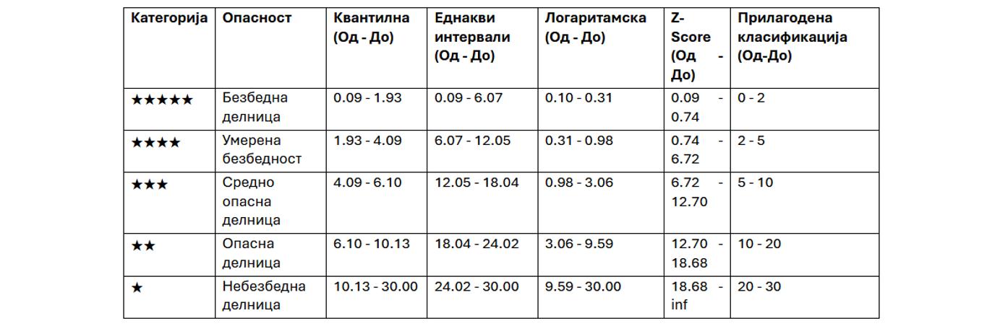

Дополнително, наведено е следното:

"Добро би било да се креира некаков шаблон/табела во која доколку се внесат очекуваните највлијателни податоци, би се добила одредена вредност за тежинскиот индекс на незгоди. Сакам на крај да земам делница од некој регионален пат (делница која не е во состав на оваа анализа) и да направам нејзина проверка со помош на оваа табеларна форма, да утврдам дали истата ќе биде безбедна или не."

-> Па, сакаме да имаме target оцена во ранг од 0 до 30 и соодветно нејзината категорија според star rating.

Оваа категоризација веќе постои за дадените делници (може да се види на страницата на IRAP која е линк-ната во предлог анализата) иако не е дадена во иницијалната табела која е споделена, но кога ги побарав овие информации како референтна точка, добив ажурирана табела во која увидов неколку грешки кои ќе бидат објаснети во наредната секција.

---

# Target

Предложениот пристап за одредување на безбедноста на дадена делница е земајќи го просекот на Wi низ годините. Во постоечките податоци ова го прават така што во просекот ги вклучуваат и годините во кои дел од делниците не постојат (со тоа што PGDS и Wi за овие години го земаат за 0), па како споредба ќе ги додадам и едната и другата варијанта, како и class таргет - бројот на ѕвезди како оценка на безбедност во двата случаеви.

### --> Правилен просек:

In [43]:
wi_cols = [f'Wi_20{i}' for i in range(14, 24)]

In [44]:
# .mean() ignorira null vrednosti
df['Target_Wi'] = df[wi_cols].mean(axis=1)

In [45]:
df[df['Target_Wi']>30]

,Last_Con,Len_Section,Avg_Rain,Max_Snow,Avg_Temp,Max_Temp,Min_Temp,Avg_Altitude,Avg_Speed_Limit,Curve_Char,...,Wi_2015,Wi_2016,Wi_2017,Wi_2018,Wi_2019,Wi_2020,Wi_2021,Wi_2022,Wi_2023,Target_Wi
56,2018,634,671,19.38,11.21,28.94,-3.41,640,60.0,40.73,...,0.0,15.773,0.0,0.0,15.773,354.89,236.593,260.252,157.729,105.6783
58,2013,293,668,19.03,11.27,29.02,-3.38,629,50.0,526.93,...,0.0,34.130,0.0,0.0,34.130,0.00,34.130,341.297,273.038,75.0855


Приметив дека во ажурираните податоци кои ги добив (според кои се одредува IRAP категоризацијата) не постојат вредности над 30, па и јас ќе ја поставам таа горна граница иако можеби ова не би било најсоодветно доколку навистина се планира моделот да се користи за регионални патишта или било какви други патишта кои немаат слични карактеристики на овие автопати. Доколку често се случува да се надмине оваа граница веројатно треба да се ажурира дангот за поделба на категории. 

Тука, се појавуваат само два такви случаеви, па сметам дека е и прифатливо да се третираат како outliers и да се спуштат на горната граница. 

In [48]:
df['Target_Wi'] = df['Target_Wi'].clip(upper=30)

In [49]:
conditions = [
    df['Target_Wi'].between(0, 2, inclusive='both'),
    df['Target_Wi'].between(2, 5, inclusive='right'),
    df['Target_Wi'].between(5, 10, inclusive='right'),
    df['Target_Wi'].between(10, 20, inclusive='right'),
    df['Target_Wi'].between(20, 30, inclusive='right')
]

In [50]:
choices = [5, 4, 3, 2, 1]

In [51]:
df['Target_Stars'] = np.select(conditions, choices, default=np.nan)

In [52]:
df['Target_Stars'] = df['Target_Stars'].astype(int)

### --> Иницијален (грешен) просек:

In [54]:
df['Target_Wi_10'] = df[wi_cols].sum(axis=1) / 10.0

In [55]:
df[df['Target_Wi_10']>30]

,Last_Con,Len_Section,Avg_Rain,Max_Snow,Avg_Temp,Max_Temp,Min_Temp,Avg_Altitude,Avg_Speed_Limit,Curve_Char,...,Wi_2017,Wi_2018,Wi_2019,Wi_2020,Wi_2021,Wi_2022,Wi_2023,Target_Wi,Target_Stars,Target_Wi_10
56,2018,634,671,19.38,11.21,28.94,-3.41,640,60.0,40.73,...,0.0,0.0,15.773,354.89,236.593,260.252,157.729,30.0,1,105.6783
58,2013,293,668,19.03,11.27,29.02,-3.38,629,50.0,526.93,...,0.0,0.0,34.130,0.00,34.130,341.297,273.038,30.0,1,75.0855


In [56]:
df['Target_Wi_10'] = df['Target_Wi_10'].clip(upper=30)

In [57]:
conditions_10 = [
    df['Target_Wi_10'].between(0, 2, inclusive='both'),
    df['Target_Wi_10'].between(2, 5, inclusive='right'),
    df['Target_Wi_10'].between(5, 10, inclusive='right'),
    df['Target_Wi_10'].between(10, 20, inclusive='right'),
    df['Target_Wi_10'].between(20, 30, inclusive='right')
]

In [58]:
df['Target_Stars_10'] = np.select(conditions_10, choices, default=np.nan)

In [59]:
df['Target_Stars_10'] = df['Target_Stars_10'].astype(int)

In [60]:
df

,Last_Con,Len_Section,Avg_Rain,Max_Snow,Avg_Temp,Max_Temp,Min_Temp,Avg_Altitude,Avg_Speed_Limit,Curve_Char,...,Wi_2018,Wi_2019,Wi_2020,Wi_2021,Wi_2022,Wi_2023,Target_Wi,Target_Stars,Target_Wi_10,Target_Stars_10
1,2013,5664,602,10.85,12.69,30.98,-2.54,376,94.00,35.33,...,0.0,0.00,0.000,0.000,3.531,18.538,2.206900,4,2.2069,4
2,2013,3489,596,10.09,12.82,31.16,-2.46,353,130.00,7.67,...,0.0,0.00,0.000,0.000,2.866,8.598,1.146400,5,1.1464,5
3,2013,2775,593,9.67,12.89,31.25,-2.42,340,130.00,43.27,...,0.0,0.00,0.000,7.207,10.811,37.838,9.369400,3,9.3694,3
4,2016,17855,598,10.27,12.79,31.11,-2.48,361,96.00,30.85,...,0.0,1.12,0.560,5.321,4.481,2.240,2.464300,4,2.4643,4
5,2017,5827,569,6.85,13.38,31.93,-2.13,251,120.00,24.54,...,0.0,0.00,1.716,6.865,24.884,0.000,3.346500,4,3.3465,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,2019,8662,570,6.91,13.37,31.92,-2.14,254,110.00,19.51,...,0.0,0.00,0.000,1.154,0.000,0.000,0.192333,5,0.1154,5
158,2019,8243,581,7.98,13.19,31.66,-2.25,294,110.00,6.21,...,0.0,0.00,0.000,0.000,0.000,1.213,0.849200,5,0.8492,5
159,2013,8233,630,14.37,12.08,30.14,-2.90,483,100.00,2.07,...,0.0,0.00,0.000,1.215,10.932,4.858,3.704600,4,3.7046,4
160,2013,2167,636,15.09,11.95,29.97,-2.97,507,106.67,2.53,...,0.0,0.00,0.000,0.000,0.000,9.229,5.537600,3,5.5376,3


Чисто бидејќи ме интересира сакам да видам колку од __класите__ варираат кога ќе се примени различениот просек:

In [62]:
df[df['Target_Stars'] != df['Target_Stars_10']]

,Last_Con,Len_Section,Avg_Rain,Max_Snow,Avg_Temp,Max_Temp,Min_Temp,Avg_Altitude,Avg_Speed_Limit,Curve_Char,...,Wi_2018,Wi_2019,Wi_2020,Wi_2021,Wi_2022,Wi_2023,Target_Wi,Target_Stars,Target_Wi_10,Target_Stars_10
13,2018,22739,570,6.77,13.40,31.94,-2.12,250,107.0,41.05,...,NaN,0.880,0.000,0.440,1.759,7.916,2.199000,4,1.0995,5
33,2019,8340,570,6.87,13.38,31.93,-2.13,253,120.0,29.77,...,0.000,1.199,11.391,0.000,1.199,1.199,2.498000,4,1.4988,5
91,2020,14119,589,9.15,12.98,31.38,-2.37,325,100.0,48.71,...,NaN,NaN,0.000,1.417,0.000,6.729,2.036500,4,0.8146,5
93,2021,14854,614,12.61,12.38,30.55,-2.72,420,72.5,45.27,...,NaN,NaN,NaN,4.713,0.673,2.020,2.468667,4,0.7406,5
94,2022,12696,586,8.88,13.03,31.45,-2.34,315,100.0,28.53,...,NaN,NaN,NaN,1.575,0.788,6.695,3.019333,4,0.9058,5
153,2019,6440,590,9.31,12.95,31.34,-2.38,328,110.0,70.41,...,0.000,0.000,22.516,32.609,4.658,1.553,10.222667,2,6.1336,3
156,2019,3233,576,7.69,13.24,31.73,-2.22,278,110.0,66.35,...,9.279,0.000,0.000,3.093,6.186,0.000,3.093000,4,1.8558,5


Разликата __во класи__ се гледа само во 7 реда. Но секако, пристапот на вкучување на податоци за делниците кога тие не постојат е грешен, па ќе продолжам со истражувањето така што ќе ги користам поточните вредности (просекот ќе се пресметува само со постоечките години).

In [64]:
added_cols = ['Target_Wi', 'Target_Stars']

In [65]:
df = df.drop(['Target_Wi_10', 'Target_Stars_10'], axis=1)

---

# Објаснување на колоните:

__Last_Con:__ Година на последна коловозна конструкција [y]

__Len_Section:__ Должина на делница [m]

__Avg_Rain:__ Просечни годишни дождови [mm/m2]

__Max_Snow:__ Просечен максимален годишен снег [mm/m2]

__Avg_Temp:__ Просечни годишни Температури [°C]

__Max_Temp:__ Mаксимални годишни Температури [°C]

__Min_Temp:__ Минимални годишни Температури [°C]

__Avg_Altitude:__ Просечна надморска височина [m]

__Avg_Speed_Limit:__ Просечна ограничена брзина [km/h]

__Curve_Char:__ Кривинска карактеристика

__Avg_Rad:__ Просечен хориознтален радиус

__Lat_Force:__ Бочен притисок [N/kg]

__Avg_Incline:__ Просечен надолжен наклон [%]

__Friction_Coef:__ Коефициент на триење

__Wheel_Ruts:__ Колотрази (вдлабнатини на позиција на тркалата на возилата) [mm]

__IRI:__ International roughness index - Подолжна нерамност измерена преку Меѓународниот индекс на рамност [m/km]

__PCI:__ Pavement condition index - Индекс на површинска оштетеност [%]

__Counterslope_Coef:__ Коефициент на контранаклон

__Visibility_H:__ Коефициент на хоризонтална прегледност

__Visibility_V:__ Коефициент на вертикална прегледност

__Sign_Age:__ Старост на вертикална сигнализација [y]

__Sign_Renewal:__ Годишно обновување на хоризонтална сигнализација [n_times/y]

__Node_Intersection_Density:__ Параметар за густина на патни јазли, крстосници и наплатни станици

__Bridge_Param:__ Параметар за густина на мостови и вијадукти

__PGDS_20XX:__ Просечен годишен дневен сообраќај за дадената година [n_vehicles/d]

__Wi_20XX:__ Тежински индекс на незгоди за дадената година 

        Wi = Nl × 1 + Nt × 10 + Nz × 85

   Nl - бројот на незгоди со полесни повреди во дадената година\
   Nt - бројот на незгоди со тешки повреди во дадената година\
   Nz - бројот на незгоди со жртви во дадената година

   Битно е да се напомене дека по правење на збирот, Wi се дели со должината на самата делница. (Ова не е спомнато во предлог анализата, но го дознав по консултација со експерт)

__Target_Wi:__ Предложената целна вредност која ја одредува безбедноста на делницата во ранг од 0 до 30. Се пресметува како средна вредност од тежинскиот индекс на незгоди од последните 10 години (притоа гледајќи ги само годините во кои делницата постои)

__Target_Stars:__ Оценка на безбедност од 1 до 5 (категориска, ординална). Одредена е според Target_Wi, поделбата на границите е според предлогот погоре


Голем дел од овие колони се разбирливи за сите, но дел бараат поголемо доменско знаење. За тие сега накратко ќе дадам опис, со тоа што подетално објаснување на сите постоечки колони има во предлог анализата:

_Curve_Char:_ Кривинската карактеристика ни го дава подобра претстава за кривините на патот. Се пресметува како сума од прекршните агли долж делницата, поделена со вкупната должина на делницата. Поголема вредност укажува на траса со остри кривини и нагласени завои, а помала вредност укажува на поблаги и полесно совладливи кривини.

_Avg_Rad:_ Средниот хоризонтален радиус ни го опишува квалитетот на геометриската искривеност на патот преку анализа на сите хоризонтални кривини на делницата преку земање на просечната вреност на радиусите на тие кривини. 

_Lat_Force:_ Бочниот притисок претставува странична сила што делува врз возилата при нивното движење низ хоризонтални кривини. Овој притисок е резултат на центрифугалната сила која што се јавува како последица на закривеноста на патиот и брзинта на движење. Високи вреднисти на бочниот притисокпридонесуваат кон намалена стабилност на возилата при движење низ кривини и зголемен ризик од пролизгување или превртување, особено кај потешки возила.

_Couterslope_Coef:_ Контранаклоните претставуваат делови од патот каде што попречниот наклон е насочен кон надворешната страна на кривината наместо кон внатрешната. Тие влијаат врз динамиката на возилото при движење низ кривини. Центрифугалната сила која дејствува коннадворешноста на кривината во комбинација со спротивната наклонетост на патот резултираат во зголемен бочен притисок врз возилото.

---

## Коментар:

Поради грешката која ја приметив за просечните вредности на PGDS и Wi, ставена сум во мисла за валидноста на останатите податоци кои се мерат на теренот (се однесуваат на самата делница, како на пример Wheel_Ruts, PCI, IRI, Avg_Incline и слично) и се земени како просечни за 10 годишен период. Препорачувам да се провери и тамиу дали се правилни пресметките или дали секаде делењето е со 10.

---

# Зависности меѓу колоните:

Во рамките на excel документот се потенцирани одредени зависности помеѓу дел од колоните, кое што може да игра клучна улога во интерпретацијата на резултатите на дел од моделите, па затоа тука ќе ги наведам сите зависности:

Следните колони зависат од __Len_Section:__ Curve_Char, Counterslope_Coef, Visibility_V, Node_Intersection_Density, Bridge_Param

Следните колони зависат од __Avg_Speed_Limit__ и __Avg_Rad:__ Lat_Force

---

# Зобгатување на податочното множество 

Множеството се состои од податоци за 161 делници од македонски автопати, така што првите 24 колони (Last_Con до Bridge_Param) се или статички податоци за самата делница (како на пример должината на самата делница) или релативно статички, па се земени како просечни за 10-годишен период (вакви се податоците за температури, врнежи на дожд и снег и сл), а последните 20 колони се податоци на годишно ниво за периодот од 2014 до 2023 (PGDS и Wi).

In [83]:
# vo df ke se chuva originalnoto mnozhestvo
# vo data ke se chuva zbogatenoto mnozhestvo

In [84]:
data = df.copy()

In [85]:
data

,Last_Con,Len_Section,Avg_Rain,Max_Snow,Avg_Temp,Max_Temp,Min_Temp,Avg_Altitude,Avg_Speed_Limit,Curve_Char,...,Wi_2016,Wi_2017,Wi_2018,Wi_2019,Wi_2020,Wi_2021,Wi_2022,Wi_2023,Target_Wi,Target_Stars
1,2013,5664,602,10.85,12.69,30.98,-2.54,376,94.00,35.33,...,0.00,0.000,0.0,0.00,0.000,0.000,3.531,18.538,2.206900,4
2,2013,3489,596,10.09,12.82,31.16,-2.46,353,130.00,7.67,...,0.00,0.000,0.0,0.00,0.000,0.000,2.866,8.598,1.146400,5
3,2013,2775,593,9.67,12.89,31.25,-2.42,340,130.00,43.27,...,0.00,0.000,0.0,0.00,0.000,7.207,10.811,37.838,9.369400,3
4,2016,17855,598,10.27,12.79,31.11,-2.48,361,96.00,30.85,...,0.56,0.000,0.0,1.12,0.560,5.321,4.481,2.240,2.464300,4
5,2017,5827,569,6.85,13.38,31.93,-2.13,251,120.00,24.54,...,0.00,0.000,0.0,0.00,1.716,6.865,24.884,0.000,3.346500,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,2019,8662,570,6.91,13.37,31.92,-2.14,254,110.00,19.51,...,NaN,NaN,0.0,0.00,0.000,1.154,0.000,0.000,0.192333,5
158,2019,8243,581,7.98,13.19,31.66,-2.25,294,110.00,6.21,...,0.00,0.000,0.0,0.00,0.000,0.000,0.000,1.213,0.849200,5
159,2013,8233,630,14.37,12.08,30.14,-2.90,483,100.00,2.07,...,0.00,0.000,0.0,0.00,0.000,1.215,10.932,4.858,3.704600,4
160,2013,2167,636,15.09,11.95,29.97,-2.97,507,106.67,2.53,...,0.00,0.000,0.0,0.00,0.000,0.000,0.000,9.229,5.537600,3


Целта е од последните 10 колони, да се изведе target колоната која ќе има вредности 0-30 (предложено погоре) и ќе го претставува индексот на безбедност на дадената делница. Предлогот иницијален е да се земе просекот на овие 10 колони, и тоа да ја одредува безбедноста на делницата, но после размислување и дискуција со професорот, сметам дека од поголем бенифит е доколку го збогатиме податочното множество на следниот начин:

--> Наместо еден внес за секоја делница, да имаме 10, така што ќе се земат првите 24 колони, и 3 други колони __PGDS__, __Wi__ за дадена година (2014 до 2023) и самата година -  __Year__. 

Со ова, не само што го збогатуваме множеството, се намалува и димензионалноста доста, од 44 колони на 26 (речиси дупло!), а може и потенцијално да се извечат дополнителни информации преку годината на последната реконструкција, бидејќи податоците ќе бидат сега на годишно ниво (повеќе за ова подоле).

Знам дека со овој пристап креираме многу дупликат редици, што може да влие негативно на предвидувањата, но да видиме првин што ќе имаме на располагање после трансформацијата, па ќе се решиме дали вреди да остане множеството какво што било оригинално или повеќе може да извлечеме од проширеното множество.

In [90]:
data_temp_pgds = pd.melt(
    data,
    id_vars = start_cols + last_cols + added_cols,
    value_vars = [f'PGDS_20{i}' for i in range(14,24)],
    var_name = 'Year',
    value_name = 'PGDS'
)

In [91]:
data_temp_pgds

,Last_Con,Len_Section,Avg_Rain,Max_Snow,Avg_Temp,Max_Temp,Min_Temp,Avg_Altitude,Avg_Speed_Limit,Curve_Char,...,Wi_2018,Wi_2019,Wi_2020,Wi_2021,Wi_2022,Wi_2023,Target_Wi,Target_Stars,Year,PGDS
0,2013,5664,602,10.85,12.69,30.98,-2.54,376,94.00,35.33,...,0.0,0.00,0.000,0.000,3.531,18.538,2.206900,4,PGDS_2014,6082
1,2013,3489,596,10.09,12.82,31.16,-2.46,353,130.00,7.67,...,0.0,0.00,0.000,0.000,2.866,8.598,1.146400,5,PGDS_2014,6082
2,2013,2775,593,9.67,12.89,31.25,-2.42,340,130.00,43.27,...,0.0,0.00,0.000,7.207,10.811,37.838,9.369400,3,PGDS_2014,6082
3,2016,17855,598,10.27,12.79,31.11,-2.48,361,96.00,30.85,...,0.0,1.12,0.560,5.321,4.481,2.240,2.464300,4,PGDS_2014,6886
4,2017,5827,569,6.85,13.38,31.93,-2.13,251,120.00,24.54,...,0.0,0.00,1.716,6.865,24.884,0.000,3.346500,4,PGDS_2014,6198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1605,2019,8662,570,6.91,13.37,31.92,-2.14,254,110.00,19.51,...,0.0,0.00,0.000,1.154,0.000,0.000,0.192333,5,PGDS_2023,7312
1606,2019,8243,581,7.98,13.19,31.66,-2.25,294,110.00,6.21,...,0.0,0.00,0.000,0.000,0.000,1.213,0.849200,5,PGDS_2023,8094
1607,2013,8233,630,14.37,12.08,30.14,-2.90,483,100.00,2.07,...,0.0,0.00,0.000,1.215,10.932,4.858,3.704600,4,PGDS_2023,18883
1608,2013,2167,636,15.09,11.95,29.97,-2.97,507,106.67,2.53,...,0.0,0.00,0.000,0.000,0.000,9.229,5.537600,3,PGDS_2023,18883


In [92]:
data_temp_wi = pd.melt(
    data,
    id_vars = start_cols + middle_cols + added_cols,
    value_vars = [f'Wi_20{i}' for i in range(14,24)],
    var_name = 'Year_tmp',
    value_name = 'Wi'
)

In [93]:
data_temp_wi

,Last_Con,Len_Section,Avg_Rain,Max_Snow,Avg_Temp,Max_Temp,Min_Temp,Avg_Altitude,Avg_Speed_Limit,Curve_Char,...,PGDS_2018,PGDS_2019,PGDS_2020,PGDS_2021,PGDS_2022,PGDS_2023,Target_Wi,Target_Stars,Year_tmp,Wi
0,2013,5664,602,10.85,12.69,30.98,-2.54,376,94.00,35.33,...,6019,11435,4551,7920,7178,10297,2.206900,4,Wi_2014,0.000
1,2013,3489,596,10.09,12.82,31.16,-2.46,353,130.00,7.67,...,6019,11435,4551,7920,7178,10297,1.146400,5,Wi_2014,0.000
2,2013,2775,593,9.67,12.89,31.25,-2.42,340,130.00,43.27,...,6019,11435,4551,7920,7178,10297,9.369400,3,Wi_2014,7.207
3,2016,17855,598,10.27,12.79,31.11,-2.48,361,96.00,30.85,...,6991,15002,5837,7367,5617,13033,2.464300,4,Wi_2014,8.681
4,2017,5827,569,6.85,13.38,31.93,-2.13,251,120.00,24.54,...,6270,11254,6185,8823,8602,13033,3.346500,4,Wi_2014,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1605,2019,8662,570,6.91,13.37,31.92,-2.14,254,110.00,19.51,...,2340,6421,5381,5208,7009,7312,0.192333,5,Wi_2023,0.000
1606,2019,8243,581,7.98,13.19,31.66,-2.25,294,110.00,6.21,...,5991,9380,7414,9139,8319,8094,0.849200,5,Wi_2023,1.213
1607,2013,8233,630,14.37,12.08,30.14,-2.90,483,100.00,2.07,...,13802,16300,13647,17415,17428,18883,3.704600,4,Wi_2023,4.858
1608,2013,2167,636,15.09,11.95,29.97,-2.97,507,106.67,2.53,...,13802,16300,13647,17415,17428,18883,5.537600,3,Wi_2023,9.229


In [94]:
data_temp_pgds['Year'] = data_temp_pgds['Year'].str.replace('PGDS_', '')
data_temp_pgds['Year'] = data_temp_pgds['Year'].astype(int)

In [95]:
data_temp = data_temp_pgds
data_temp.drop(columns=[f'Wi_20{i}' for i in range(14,24)], axis=1, inplace=True)
data_temp['Wi'] = data_temp_wi['Wi']

In [96]:
data = data_temp

In [97]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1610 entries, 0 to 1609
Data columns (total 29 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Last_Con                   1610 non-null   int32  
 1   Len_Section                1610 non-null   int32  
 2   Avg_Rain                   1610 non-null   int32  
 3   Max_Snow                   1610 non-null   float64
 4   Avg_Temp                   1610 non-null   float64
 5   Max_Temp                   1610 non-null   float64
 6   Min_Temp                   1610 non-null   float64
 7   Avg_Altitude               1610 non-null   int32  
 8   Avg_Speed_Limit            1610 non-null   float64
 9   Curve_Char                 1610 non-null   float64
 10  Avg_Rad                    1610 non-null   int32  
 11  Lat_Force                  1610 non-null   float64
 12  Avg_Incline                1610 non-null   float64
 13  Friction_Coef              1610 non-null   float

---

## Релевантност на колоните Year и Last_Con

Доколку размислиме, моменталната година како и годината на последната коловозна конструкција сами по себе не ни носат некаква релевантна информација која би ни послужила во понатамошните предвидувања, но многу порелевантна информација е колку години се поминати од последната коловозна конструкција, кое може да го земеме како разлика на овие две колони.

In [101]:
data['Years_Since_Last_Con'] = data['Year'] - data['Last_Con']

In [102]:
data['Years_Since_Last_Con'].value_counts()

Years_Since_Last_Con
 1     161
 2     160
 3     155
 4     150
 5     129
 6     112
 7     102
 8      98
 10     94
 9      94
 0      67
-1      67
-2      63
-3      59
-4      49
-5      32
-6      11
-7       6
-8       1
Name: count, dtype: int64

Добиваме негативни вредности за редовите чиј податоци се за година пред последната документирана коловозна конструкција. Во овој случај податокот за кога била последната коловозна конструкција ни е непознат. 

Од претходни консултации со експерт, се сетив на следното: \
"Најмногу од обновувањето на коловозната конструкција зависи вертикалната сигнализација (знаците). Вообичаено со рехабилитација или реконструкција поставуваат нови знаци."

Па, како информирана претпоставка ќе го поставам бројот на години од последната коловозна реконструкција според староста на вертикалната патна сигнализација (со тоа што претпоставувам дека староста е измерена во 2023):

In [106]:
data['Years_Since_Last_Con'] = data['Years_Since_Last_Con'].mask(
    data['Years_Since_Last_Con'] < 0, 
    data['Sign_Age'] - (2023 - data['Year'])
)

In [107]:
data['Years_Since_Last_Con'].value_counts()

Years_Since_Last_Con
 2     165
 3     164
 1     162
 4     159
 5     132
 6     117
 7     106
 9     105
 10    104
 8     102
 0      68
-2      23
-3      23
-4      23
-1      19
-5      19
 11     15
 13     13
 12     13
 14     10
 17      9
-6       9
 16      8
 18      7
-7       7
 15      5
 22      4
 19      4
 21      4
 23      4
 20      2
 24      2
 25      1
 26      1
 27      1
Name: count, dtype: int64

Повторно се сретнуваме со негативни вредности, да видиме што се случува поделтално:

In [109]:
tmp = data[data['Years_Since_Last_Con'] < 0]
tmp[['Last_Con', 'Year', 'Sign_Age', 'Years_Since_Last_Con']]

,Last_Con,Year,Sign_Age,Years_Since_Last_Con
12,2018,2014,5,-4
13,2018,2014,5,-4
28,2019,2014,4,-5
29,2019,2014,4,-5
30,2019,2014,4,-5
...,...,...,...,...
897,2021,2019,2,-2
898,2022,2019,3,-1
1048,2021,2020,2,-1
1057,2021,2020,2,-1


Сеуште се соочуваме со проблем: онде каде што тековната година на податоците од редот е пред годината на последно поставување на знаци за кои знаеме. Овие вредности се непознати, па ќе ги сетирам на null и ќе се справам со нив подолу:

In [111]:
data.loc[data['Years_Since_Last_Con'] < 0, 'Years_Since_Last_Con'] = np.nan

In [112]:
data['Years_Since_Last_Con'] = data['Years_Since_Last_Con'].astype('Int64')

---

# Претпроцесирање

## _Справување со missing values:_

### _df - оригиналното множество_

In [117]:
df.isnull().sum()

Last_Con                      0
Len_Section                   0
Avg_Rain                      0
Max_Snow                      0
Avg_Temp                      0
Max_Temp                      0
Min_Temp                      0
Avg_Altitude                  0
Avg_Speed_Limit               0
Curve_Char                    0
Avg_Rad                       0
Lat_Force                     0
Avg_Incline                   0
Friction_Coef                 0
Wheel_Ruts                    0
IRI                           0
PCI                           0
Counterslope_Coef             0
Visibility_H                  0
Visibility_V                  0
Sign_Age                      0
Sign_Renewal                  0
Node_Intersection_Density     0
Bridge_Param                  0
PGDS_2014                    18
PGDS_2015                    18
PGDS_2016                    18
PGDS_2017                    18
PGDS_2018                     8
PGDS_2019                     4
PGDS_2020                     3
PGDS_202

<Axes: >

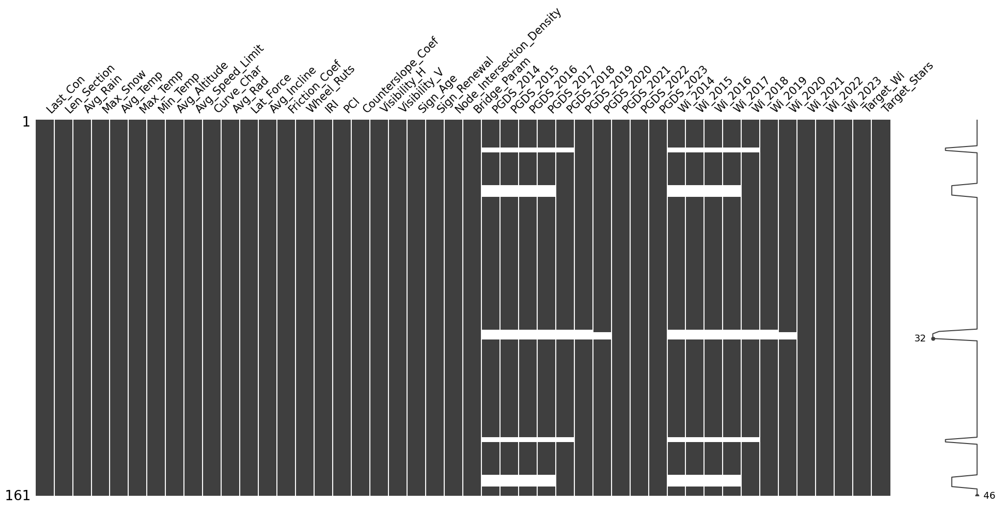

In [118]:
msno.matrix(df)

Очекувано, во годините каде што не постоеле делниците ги немаме податоците за просечен годишен дневен сообраќај и тежински индекс на незгоди. Во однос на справувањето со овие вредности, за сега ќе ги оставам како такви податоците кои фалат од тешинскиот индекс за незгоди. Ова го правам од причина што тие нема да се користат во предвидувањето секако бидејќи аналитички се добива таргетот од нив со просек.

За вредностите на PGDS - сметам дека од поголем интерес би ни било да ја претставиме оваа вредност како просечна за последните 10 години во кои постоела улицата главно од причина што доста ја намалуваме димензионалноста на податоците (10 колони ги сведуваме на една). Секако целната колона ни е земена како просечна од 10те Wi колони, па претпоставувам дека дури и да успееме да увидиме некакво однесување во промена на сообраќајот (како нагло зболемување), не би можеле да го видиме ефектот на тоа врз Wi бидеќи таа е запросечена.

In [121]:
pgds_cols = [f'PGDS_20{i}' for i in range(14,24)]

In [122]:
df['PGDS_Avg'] = np.ceil(df[pgds_cols].mean(axis=1)).astype(int)

#### Потсредување на df:

Може да се отстранат годишните колони за PGDS и Wi бидејќи нема да ни требаат.

In [125]:
df_b4 = df.copy() # Potrebno za vizualizaciite podole...

In [126]:
wi_cols = [f'Wi_20{i}' for i in range(14,24)]

In [127]:
exclude = pgds_cols + wi_cols

In [128]:
clean_columns = df.columns.tolist()

In [129]:
clean_columns = [c for c in clean_columns if c not in exclude]

In [130]:
df = df[clean_columns].copy()

In [131]:
df.isnull().sum()

Last_Con                     0
Len_Section                  0
Avg_Rain                     0
Max_Snow                     0
Avg_Temp                     0
Max_Temp                     0
Min_Temp                     0
Avg_Altitude                 0
Avg_Speed_Limit              0
Curve_Char                   0
Avg_Rad                      0
Lat_Force                    0
Avg_Incline                  0
Friction_Coef                0
Wheel_Ruts                   0
IRI                          0
PCI                          0
Counterslope_Coef            0
Visibility_H                 0
Visibility_V                 0
Sign_Age                     0
Sign_Renewal                 0
Node_Intersection_Density    0
Bridge_Param                 0
Target_Wi                    0
Target_Stars                 0
PGDS_Avg                     0
dtype: int64

### _data - проширеното множество_

In [133]:
data.isnull().sum()

Last_Con                       0
Len_Section                    0
Avg_Rain                       0
Max_Snow                       0
Avg_Temp                       0
Max_Temp                       0
Min_Temp                       0
Avg_Altitude                   0
Avg_Speed_Limit                0
Curve_Char                     0
Avg_Rad                        0
Lat_Force                      0
Avg_Incline                    0
Friction_Coef                  0
Wheel_Ruts                     0
IRI                            0
PCI                            0
Counterslope_Coef              0
Visibility_H                   0
Visibility_V                   0
Sign_Age                       0
Sign_Renewal                   0
Node_Intersection_Density      0
Bridge_Param                   0
Target_Wi                      0
Target_Stars                   0
Year                           0
PGDS                          87
Wi                            87
Years_Since_Last_Con         123
dtype: int

За редовите во кои Wi е null, знаеме дека делницата не постоела во дадената година, па бесмислено би било да ги задржиме овие редови (не може да чуваме податоци за делница која не постои сеуште, а уште помалку да карикираме за тоа која би била нејзината оцена на безбедност).

In [135]:
data.dropna(subset=["Wi"], axis=0, inplace=True)

In [136]:
data = data.reset_index(drop=True)

In [137]:
data.isnull().sum()

Last_Con                      0
Len_Section                   0
Avg_Rain                      0
Max_Snow                      0
Avg_Temp                      0
Max_Temp                      0
Min_Temp                      0
Avg_Altitude                  0
Avg_Speed_Limit               0
Curve_Char                    0
Avg_Rad                       0
Lat_Force                     0
Avg_Incline                   0
Friction_Coef                 0
Wheel_Ruts                    0
IRI                           0
PCI                           0
Counterslope_Coef             0
Visibility_H                  0
Visibility_V                  0
Sign_Age                      0
Sign_Renewal                  0
Node_Intersection_Density     0
Bridge_Param                  0
Target_Wi                     0
Target_Stars                  0
Year                          0
PGDS                          0
Wi                            0
Years_Since_Last_Con         41
dtype: int64

Преостануваат дел од редовите каде што не знаеме колку точно време е поминато од последната коловозна конструкција. Да видиме како се распределени овие податоци:

In [139]:
data['Years_Since_Last_Con'].value_counts()

Years_Since_Last_Con
2     165
3     164
1     162
4     159
5     132
6     117
7     106
9     105
10    104
8     102
0      63
11     15
12     13
13     13
14     10
17      9
16      8
18      7
15      5
22      4
21      4
19      4
23      4
20      2
24      2
25      1
26      1
27      1
Name: count, dtype: Int64

<Axes: ylabel='Frequency'>

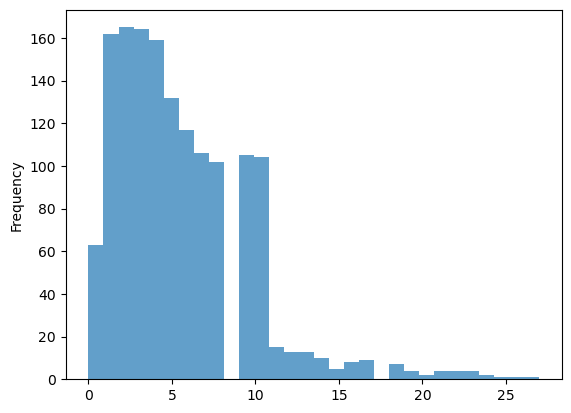

In [140]:
data['Years_Since_Last_Con'].plot.hist(alpha=0.7, bins=30)

Ќе претпоставам некој теоретски worst case, и ќе ги поставам непостоечките вредности на онаа која е највисока меѓу постоечките најдени податоци. Ќе додадам и една boolean (1/0) колона која ќе е True (1) за овие редови - означувајќи дека нивната вредност е несигурна. Таа колона ќе се вика __Unsure_YSLC__.

In [142]:
data['Unsure_YSLC'] = data['Years_Since_Last_Con'].isna().astype(int) 

In [143]:
data['Years_Since_Last_Con'] = data['Years_Since_Last_Con'].fillna(data['Years_Since_Last_Con'].max())

In [144]:
data.isnull().sum()

Last_Con                     0
Len_Section                  0
Avg_Rain                     0
Max_Snow                     0
Avg_Temp                     0
Max_Temp                     0
Min_Temp                     0
Avg_Altitude                 0
Avg_Speed_Limit              0
Curve_Char                   0
Avg_Rad                      0
Lat_Force                    0
Avg_Incline                  0
Friction_Coef                0
Wheel_Ruts                   0
IRI                          0
PCI                          0
Counterslope_Coef            0
Visibility_H                 0
Visibility_V                 0
Sign_Age                     0
Sign_Renewal                 0
Node_Intersection_Density    0
Bridge_Param                 0
Target_Wi                    0
Target_Stars                 0
Year                         0
PGDS                         0
Wi                           0
Years_Since_Last_Con         0
Unsure_YSLC                  0
dtype: int64

---

# Update - Објаснување на колоните:

...

__Year:__ Годината на која се однесуваат податоците од редот [y]

__PGDS:__ Просечниот годишен дневен сообраќај за дадената делница и година (Year) од редот

__Wi:__ Тежинскиот индекс на незгоди за дадената делница и година (Year) од редот

__Years_Since_Last_Construction:__ Број на години поминати од последната коловозна конструкција [y]

__Unsure_YSLC:__ Boolean вредност која ни кажува дека вредноста поставена за Years_Since_Last_Construction е несигурна 

__PGDS_Avg:__ Просечната вредност на PGDS за дадена делница

---

# Преглед на ефектот на трансформацијата (прошурувањето) на множеството, дали да се задржи?

При проширувањето, единственото нешто кое се менува меѓу редовите на податоците од истата делница е дневниот сообраќај и годината од последната реконструкција на патот. Сакаме да видиме дали податокот за тоа колку време е помината од последната реконструкција влијае на тежинскиот индекс на незгоди - имено, дали по реконстручција патот е побезбеден?

За оваа цел, на lineplots ќе ги претставиме сите делници кои се реконструирани во дадена година и ќе споредиме какви се вредностите на Wi пред и после реконструкцијата.

In [154]:
df['Last_Con'].value_counts()

Last_Con
2013    94
2019    21
2018    17
2017    10
2020     5
2021     5
2016     4
2015     4
2022     1
Name: count, dtype: int64

За 2013, нема да можеме да направиме споредба бидеќи немаме податоци за пред реконструкцијата.

In [156]:
def plot_wi_by_renewal_year(df, renewal_year):
    plt.figure(figsize=(12, 5))
    
    wi_cols = sorted([col for col in df.columns if col.startswith('Wi_20')])
    years = [int(col.split('_')[1]) for col in wi_cols]
    
    filtered_df = df[df['Last_Con'] == renewal_year]
    
    for idx, row in filtered_df.iterrows():
        plt.plot(years, row[wi_cols].values, marker='o', alpha=0.5)
    
    plt.axvline(x=renewal_year, color='red', linestyle='--', linewidth=2, label=f'Renewal Year ({renewal_year})')
    
    plt.xlabel('Year')
    plt.ylabel('Wi Value')
    plt.title(f'Wi Values Over Time (Last_Con = {renewal_year})')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(years)
    plt.legend()
    plt.tight_layout()
    plt.show()

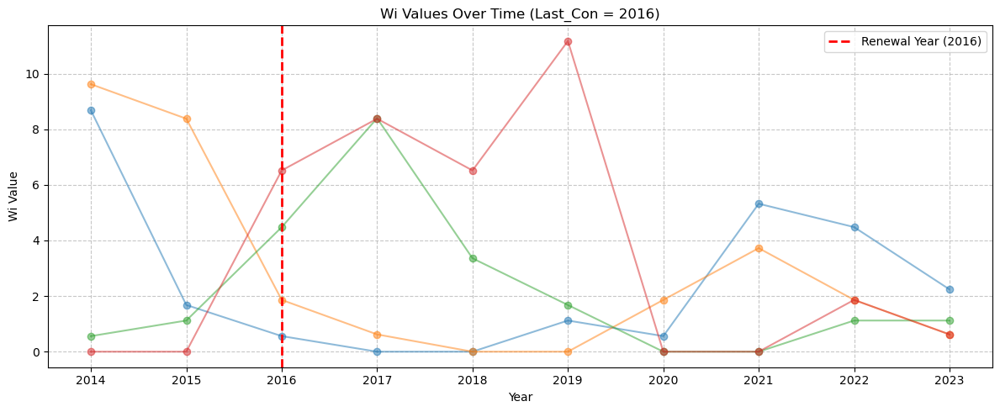

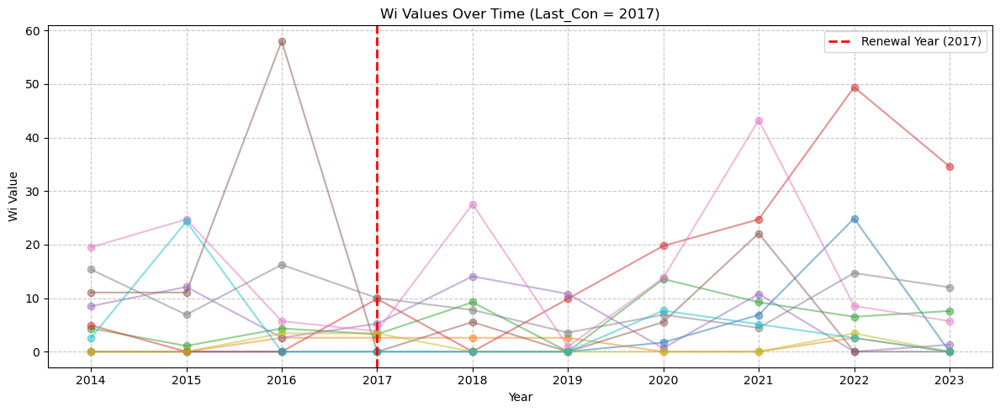

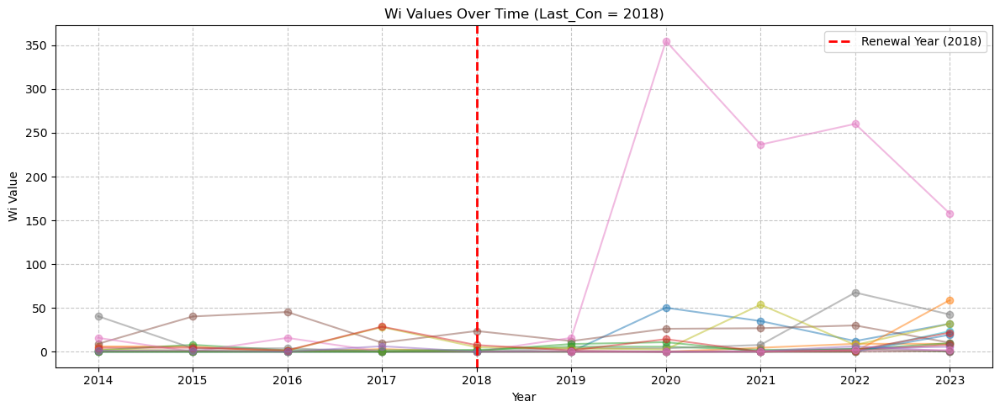

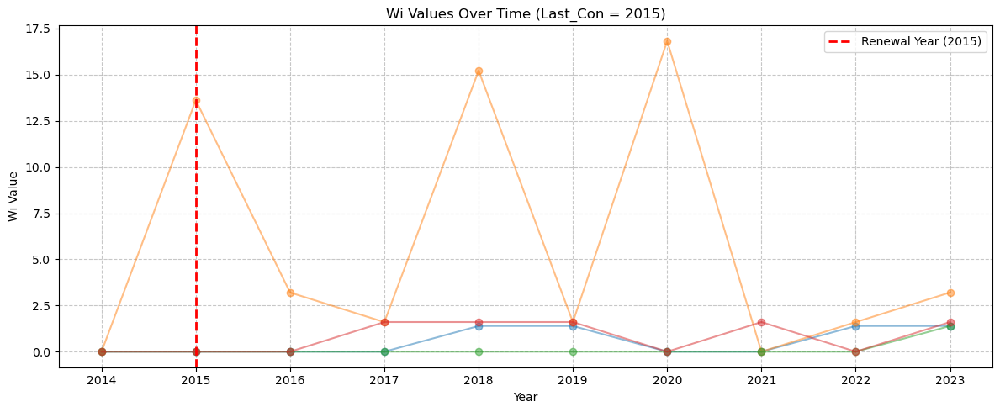

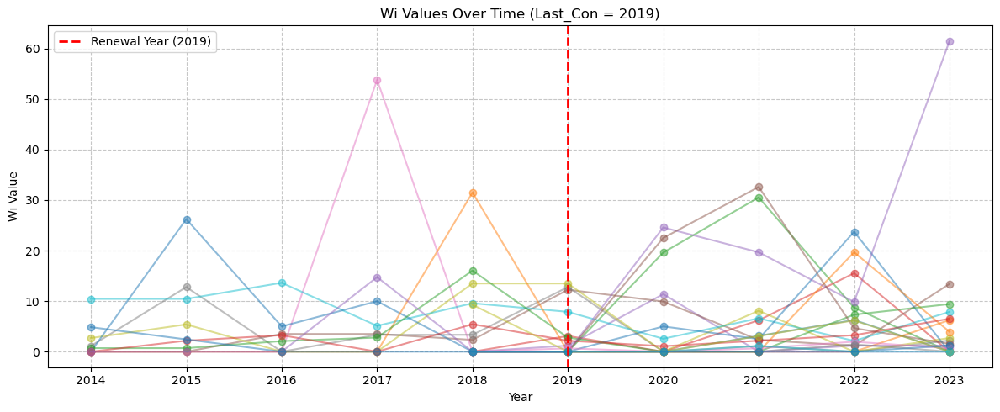

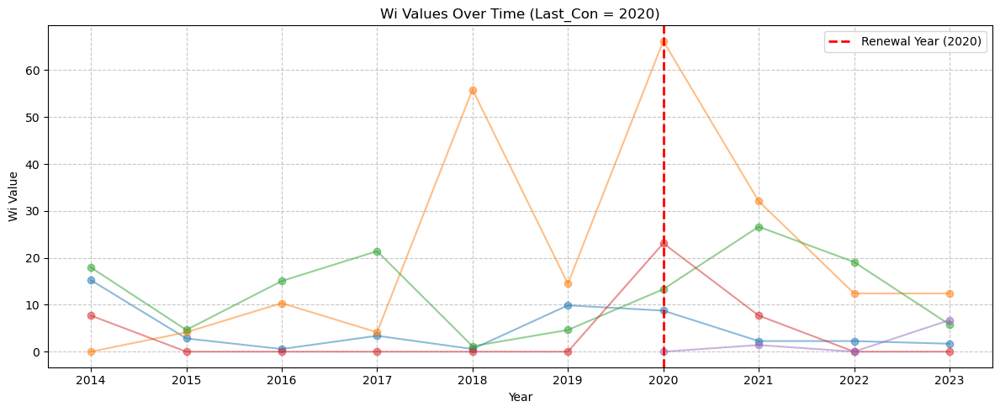

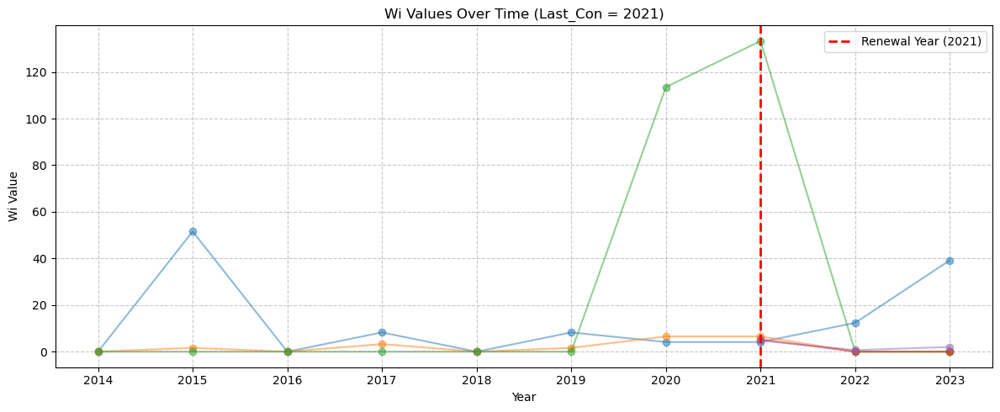

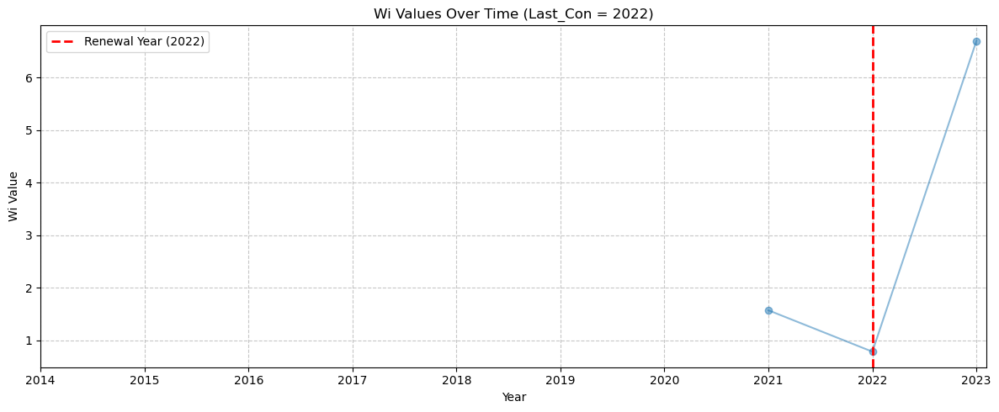

In [157]:
years = data['Last_Con'].unique().tolist()

for year in years:
    if year <= 2014: # godishnite podatoci se 2014-2023, pa mora da ima barem edna godina pominato za da imame sporedba
        continue
    plot_wi_by_renewal_year(df_b4, year)

Да ги видиме и резултатите табеларно:

In [159]:
def create_reconstruction_stats(df):
    wi_cols = sorted([col for col in df.columns if col.startswith('Wi_20')])
    years = [int(col.split('_')[1]) for col in wi_cols]
    col_by_year = {int(col.split('_')[1]): col for col in wi_cols}
    
    stats = []
    
    for idx, row in df.iterrows():
        if row['Last_Con'] <= 2014:
            continue
        
        renewal_year = row['Last_Con']
        
        wi_before = row[col_by_year[renewal_year - 1]]
        wi_during = row[col_by_year[renewal_year]]
        wi_after = row[col_by_year[renewal_year + 1]]
        
        after_cols = [col_by_year[y] for y in years if y > renewal_year]
        avg_after = row[after_cols].mean()

        after_and_during_cols = [col_by_year[y] for y in years if y >= renewal_year]
        avg_after_and_during = row[after_and_during_cols].mean()
        
        stats.append({
            'reconstruction_year': renewal_year,
            'wi_before': wi_before,
            'wi_during': wi_during,
            'wi_after': wi_after,
            'avg_wi_after': avg_after,
            'avg_wi_after_and_during': avg_after_and_during
        })
    
    return pd.DataFrame(stats)

In [160]:
stats_df = create_reconstruction_stats(df_b4)

In [161]:
stats_df

,reconstruction_year,wi_before,wi_during,wi_after,avg_wi_after,avg_wi_after_and_during
0,2016,1.680,0.560,0.000,1.960286,1.785250
1,2017,0.000,0.000,0.000,5.577500,4.780714
2,2018,0.000,0.000,0.000,25.867400,21.556167
3,2018,2.997,0.000,0.000,4.495600,3.746333
4,2018,1.625,2.167,5.688,5.200600,4.695000
...,...,...,...,...,...,...
62,2019,0.000,0.658,0.000,0.822250,0.789400
63,2019,0.000,0.000,0.000,0.363250,0.290600
64,2019,9.279,0.000,0.000,2.319750,1.855800
65,2019,0.000,0.000,0.000,0.288500,0.230800


__Идеата позади наредниве визуализации е следна:__ Да се претстават на две оски вредностите пред и по реконструкција. Вредностите пред реконструкцијата ќе ги поставиме на y-оската, а вредностите по на x-оската. Доколку точките кои ќе ги претставиме на овој scatterplot се наогаат целосно над y=x правата, вредностите за y секогаш се поголеми од x, т.е. вредностите пред реконструкцијата се повисоки (полоши) споредбено со после реконструкцијата. Ова е иделано тоа што сакаме да го видиме.

Бидејќи не знаеме точно кога во годината се правеле реконструкции (дали се реконструирала на почеток на годината па за таа година вредностите се за обновена делница, или подоцна во годината па вредностите би се однесувале повеќе на необновена делница), ќе ги претставам двата случаеви. 

In [164]:
def plot_stats_results(x, y, stats):
    ax = stats.plot.scatter(x=x, y=y, c=stats['reconstruction_year'], colormap='viridis')
    
    min_val = 0
    max_val = max(stats[x].max(), stats[y].max())
    padding = (max_val - min_val) * 0.05
    
    ax.set_xlim(min_val - padding, max_val + padding)
    ax.set_ylim(min_val - padding, max_val + padding)
    ax.set_aspect('equal')
    
    line_range = np.linspace(min_val - padding, max_val + padding, 100)
    ax.plot(line_range, line_range, 'r--', alpha=0.7, label='y = x')
    
    ax.legend()
    plt.tight_layout()
    plt.show()

Однос на вредноста на Wi годината пред и годината по реконстукцијата:

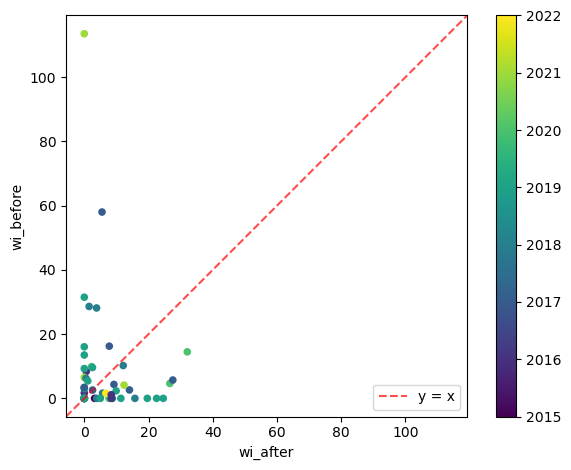

In [166]:
plot_stats_results(y='wi_before', x='wi_after', stats=stats_df)

Однос на вредноста на Wi годината пред и просечната вредност на Wi сите години по реконстукцијата:

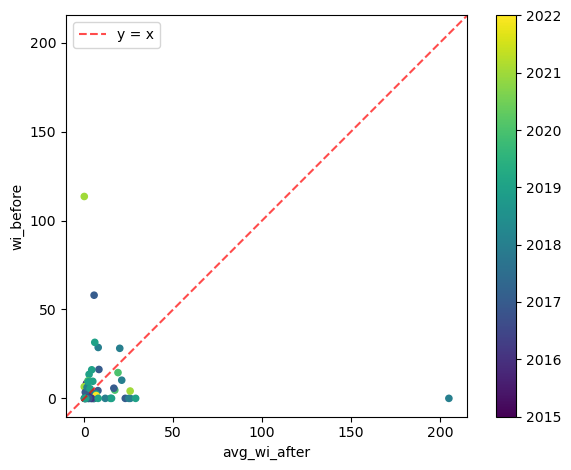

In [168]:
plot_stats_results(y='wi_before', x='avg_wi_after', stats=stats_df)

Однос на вредноста на Wi годината пред и годината на реконстукцијата:

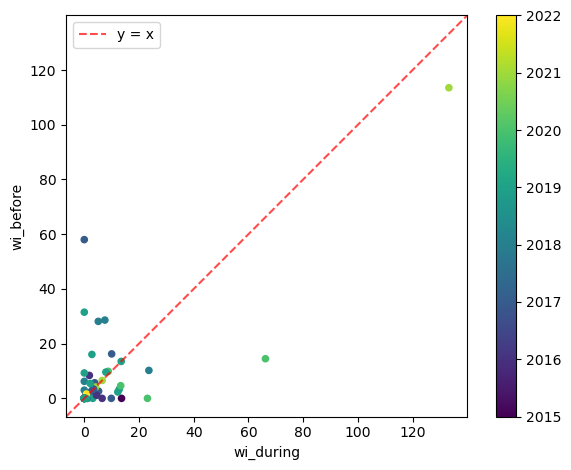

In [170]:
plot_stats_results(y='wi_before', x='wi_during', stats=stats_df)

Однос на вредноста на Wi годината пред и просечната вредност на Wi сите години од реконстукцијата:

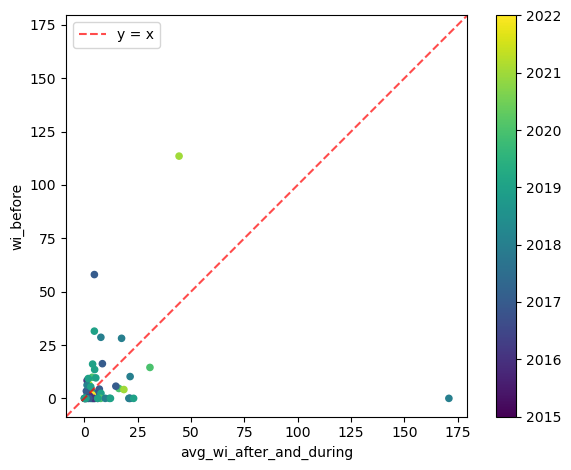

In [172]:
plot_stats_results(y='wi_before', x='avg_wi_after_and_during', stats=stats_df)

Од тоа што можам да видам, би рекла дека пола-пола се поделени примероците во однос на тоа дали се повисоки пред или после. Па оваа колона реално не би ни помогнала мноу во предвидувањето.

Останува уште да видиме дали просечниот годишен двевен сообраќај значително влијае на вредноста на Wi:

In [175]:
corr_matrix = data.corr()

In [176]:
correlations = corr_matrix.loc[['Wi'], data.columns]

<Axes: >

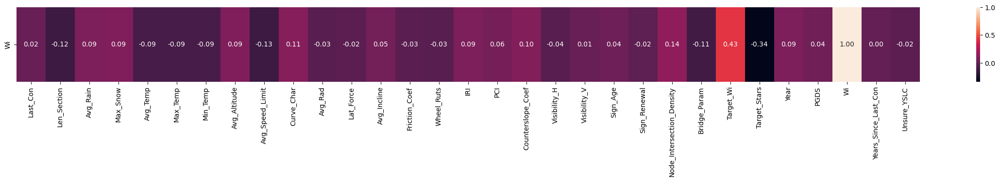

In [177]:
plt.figure(figsize=(30, 2))
sns.heatmap(correlations, annot=True, fmt='.2f')

Не гледаме линеарна врска меѓу PGDS и таргетот. Да видиме дали има можеби друга врска преку scatterplot:

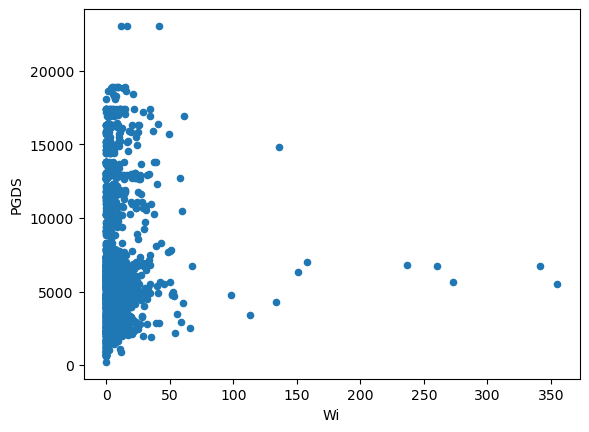

In [179]:
data.plot.scatter(x="Wi", y="PGDS");

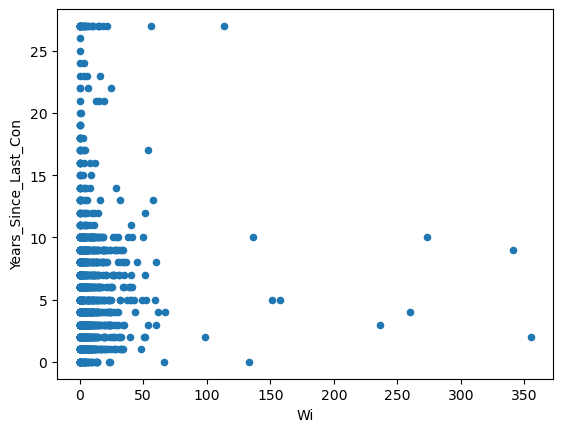

In [180]:
data.plot.scatter(x="Wi", y="Years_Since_Last_Con");

Дефинитивно не добиваме значајна информанија ниту преку годината од последната реконструкција, ниту од податокот за просечниот годишен дневен сообраќај.

__Веројатно не е соодветно да се продолжи со проширениот датасет.__ Не само бидејќи не добивме дополнителни информации туку поради проблемот на избирање на target во ваквата табела. 

## Соодветноста на Wi како target vo проширениот dataset

Се соочуваме со две опции за избор на target во овој dataset: 
1) Годишната вредност на Wi да се земе за нов таргет
2) Да се задржи просечната вредност на Wi како target за сите редови кои произлегуваат од делницата 

Сметам дека е несоодветно да се сочува просечната како таргет за сите, од причина што ќе се сведат редовите на апсолутни дупликати освен PGDS и Years_Since_Last_Con. Дополнително, тоа би значело дека разликата во овие 2 колони не влијае на targetot (за X-ови кои се разликуваат само во овие колони ќе имаме идентични вредности на y) - па нивното присуство е не многу значително, а доколку ги отстраниме ќе останеме со 10-тина тотално исти редови. Со други зборови - ништо не сме направиле. Па мислам дека поправилно би било да се задржат годишните Wi како target за овие редови. Но сега се среќаваме со друг проблем:

In [186]:
conditions = [
    data['Wi'].between(0, 2, inclusive='both'),
    data['Wi'].between(2, 5, inclusive='right'),
    data['Wi'].between(5, 10, inclusive='right'),
    data['Wi'].between(10, 20, inclusive='right'),
    data['Wi'] > 20
]

In [187]:
data['Stars'] = np.select(conditions, choices, default=np.nan) # postavuvannje na stars na ist nachin kako so prosechniot wi

In [188]:
data['Stars'] = data['Stars'].astype(int)

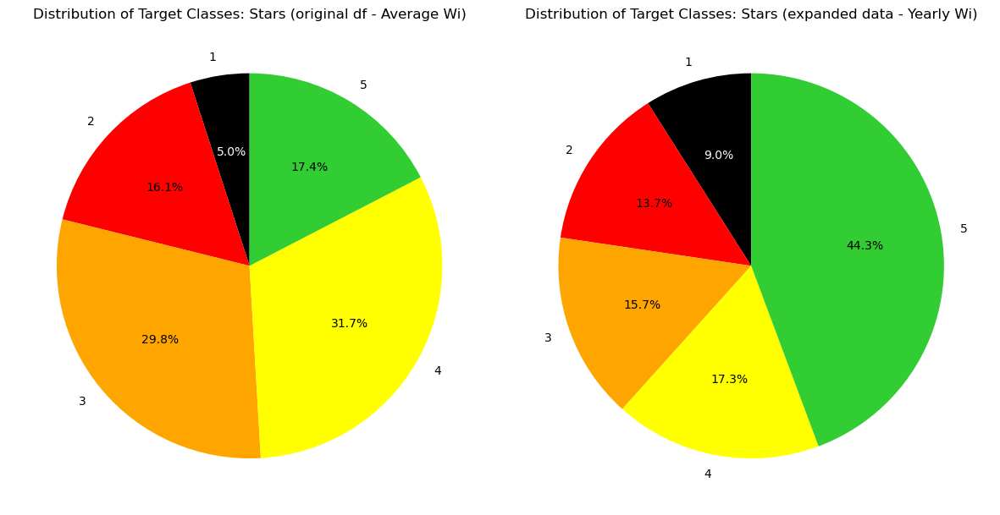

In [189]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

counts_df = df['Target_Stars'].value_counts().sort_index()
wedges1, texts1, autotexts1 = axes[0].pie(
    counts_df.values,
    labels=counts_df.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=['black', 'red', 'orange', 'yellow', 'limegreen']
)
for wedge, autotext in zip(wedges1, autotexts1):
    if wedge.get_facecolor()[:3] == (0.0, 0.0, 0.0):
        autotext.set_color('white')
axes[0].set_title('Distribution of Target Classes: Stars (original df - Average Wi)')

counts_data = data['Stars'].value_counts().sort_index()
wedges2, texts2, autotexts2 = axes[1].pie(
    counts_data.values,
    labels=counts_data.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=['black', 'red', 'orange', 'yellow', 'limegreen']
)
for wedge, autotext in zip(wedges2, autotexts2):
    if wedge.get_facecolor()[:3] == (0.0, 0.0, 0.0):
        autotext.set_color('white')
axes[1].set_title('Distribution of Target Classes: Stars (expanded data - Yearly Wi)')

plt.tight_layout()
plt.show()

Имаме значителна разлика во уделот на категориите споредбено оригиналните податоци...

Од претходна секција, знаеме дека праговите за категориите на безбедност се одредени според __дистрибуцијата__ тежинскиот индекс на незгоди во оригиналните податоци (гледајќи ги просечните вредности на Wi на 10-годишно ниво). Доколу ја задржуваме оваа проширена верзија на податоците, не мора да значи дека тие поделби би биле соодветни за Wi на годишно ниво. 

Да ги погледнеме дистрибуциите на Wi и Target_Wi една до друга:

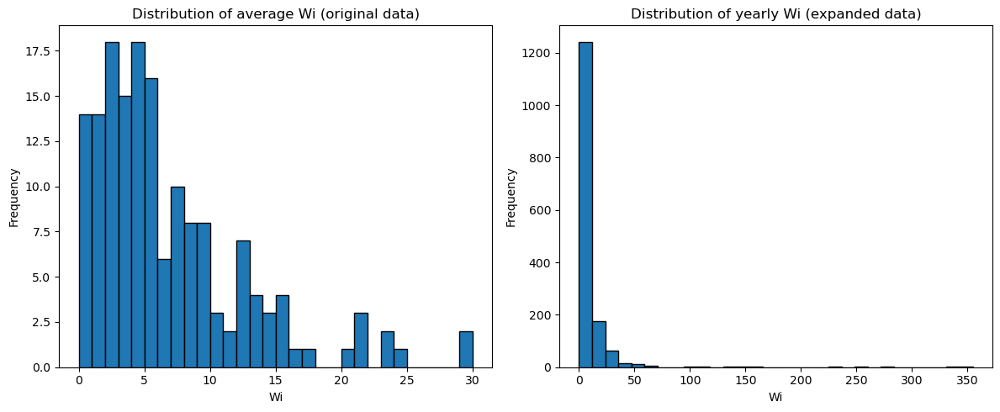

In [193]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].hist(df['Target_Wi'], bins=30, edgecolor='black')
axes[0].set_title('Distribution of average Wi (original data)')
axes[0].set_xlabel('Wi')
axes[0].set_ylabel('Frequency')

axes[1].hist(data['Wi'], bins=30, edgecolor='black')
axes[1].set_title('Distribution of yearly Wi (expanded data)')
axes[1].set_xlabel('Wi')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

Очигледно, значително различно се распределени податоците, па би требало да се обидеме да поставиме нови граници на категориите на ѕвездите. Ова ќе се обидам да го направам на ист начин како што ги имаат одредено иницијалните прегови. Ако се навратиме на "Цел" секцијата - може да приметиме дека праговите се најслични со z-score праговите кои и имаат земено за податоците. Да се обидеме истото да го направиме за годишните Wi:

In [195]:
original_mean = df['Target_Wi'].mean()
original_std = df['Target_Wi'].std()

In [196]:
print(f"Original mean: {original_mean}\nOriginal standard deviation: {original_std}")

Original mean: 6.856653623188405
Original standard deviation: 5.914606645364619


In [197]:
z_bounds_raw = [0.09, 0.74, 6.72, 12.70, 18.68] # zemeni od tabelata vo "Cel" sekcijata

In [198]:
z_cutoffs = [(b - original_mean) / original_std for b in z_bounds_raw]
print("Z-cutoffs used:", z_cutoffs)

Z-cutoffs used: [-1.1440580969981413, -1.0341606787971496, -0.023104431348026082, 0.9879518161010973, 1.9990080635502208]


In [199]:
yearly_mean = data['Wi'].mean()
yearly_std = data['Wi'].std()

In [200]:
print(f"Yearly mean: {yearly_mean}\nYearly standard deviation: {yearly_std}")

Yearly mean: 7.8956277084701245
Yearly standard deviation: 20.8006165429053


In [201]:
new_bounds = [yearly_mean + (z * yearly_std) for z in z_cutoffs]
print("New bounds for yearly data:", new_bounds)

New bounds for yearly data: [-15.901486069994169, -13.615552014940038, 7.415041291557953, 28.44563459805594, 49.47622790455393]


Добиваме прагови во негатива, што не одговара на нашата потреба бидејќи рангот на податоците ни е од 0 до теоретски +inf. Ова се случува дека има многу поголема std во во проширените податоци, а голем дел од нив се блиску до 0 па левите граници одат во минус. Да пробаме да поставиме горна граница на 30  како во оригиналните податоци:

In [203]:
tmp = data[['Wi']].copy()
tmp['Bounded_Wi'] = tmp['Wi'].clip(upper=30)

In [204]:
yearly_mean = tmp['Bounded_Wi'].mean()
yearly_std = tmp['Bounded_Wi'].std()

In [205]:
print(f"Yearly mean: {yearly_mean}\nYearly standard deviation: {yearly_std}")

Yearly mean: 6.184492449113591
Yearly standard deviation: 8.218976910725743


In [206]:
new_bounds = [yearly_mean + (z * yearly_std) for z in z_cutoffs]
print("New bounds for yearly data:", new_bounds)

New bounds for yearly data: [-3.2184946346429655, -2.315250291900643, 5.994597661328717, 14.304445614558075, 22.614293567787435]


Ова помогна во однос на редукција на std, но повторно и со помала std одиме во минус. 

Следен пристап кој може да го пробаме е да ги одредиме според перцентили ранговите како што е предложено во документот за предлог анализа:

In [209]:
quantile_bounds = data['Wi'].quantile([0.2, 0.4, 0.6, 0.8])

In [210]:
print(f"New star rating bounds based on quantiles:\n{quantile_bounds}")

New star rating bounds based on quantiles:
0.2     0.0000
0.4     1.4612
0.6     4.6374
0.8    10.8134
Name: Wi, dtype: float64


Според тоа што добиваме ист праг за првите две категории гледаме дека барем 20% од податоците се еднакви на 0. Да погледнеме колкав удел на податоците е навистина 0:

In [212]:
zero_count = (data['Wi'] == 0.0).sum()
total_count = len(data)
percentage = (zero_count / total_count) * 100

print(f"Zero values: {zero_count} out of {total_count} ({percentage:.2f}%)")

Zero values: 507 out of 1523 (33.29%)


Бидејќи уделот на 0.0 е поголем од 20% сметам дека е несоодветно да се користат перцентили како прагови за овие податоци. Но покрај тоа, во оригиналните податоци не се ни придржуваат за овие прагови, па секако не би одговарало многу за нашите потреби.

Ова значи дека би продолжиле со оригиналните скали доколку евентуално се решиме да го користиме ова множество. Но пред да ја направиме оваа одлука, сметам дека е од корист да знаеме како варираат вредностите на Wi во рамки на една делница? Колку отстапуваат од просечната вредност?

In [215]:
diff_from_mean = abs(df_b4[wi_cols].sub(df_b4[wi_cols].mean(axis=1), axis=0))
diff_from_mean.head(3)

,Wi_2014,Wi_2015,Wi_2016,Wi_2017,Wi_2018,Wi_2019,Wi_2020,Wi_2021,Wi_2022,Wi_2023
1,2.2069,2.2069,2.2069,2.2069,2.2069,2.2069,2.2069,2.2069,1.3241,16.3311
2,1.1464,1.1464,1.1464,1.1464,1.1464,1.1464,1.1464,1.1464,1.7196,7.4516
3,2.1624,21.2616,9.3694,9.3694,9.3694,9.3694,9.3694,2.1624,1.4416,28.4686


In [216]:
all_diffs = diff_from_mean.values.flatten()

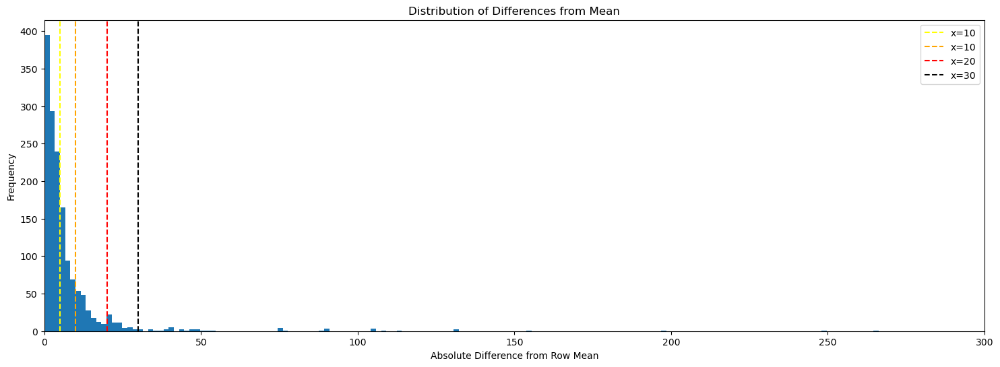

In [217]:
plt.figure(figsize=(18, 6))
plt.hist(all_diffs, bins=161)
plt.xlabel('Absolute Difference from Row Mean')
plt.ylabel('Frequency')
plt.title('Distribution of Differences from Mean')
plt.xlim(0, 300)
plt.axvline(x=5, color='yellow', linestyle='--', label='x=10')
plt.axvline(x=10, color='orange', linestyle='--', label='x=10')
plt.axvline(x=20, color='red', linestyle='--', label='x=20')
plt.axvline(x=30, color='black', linestyle='--', label='x=30')
plt.legend()
plt.show()

Може да видиме дека има доста случаеви каде што варираат барем од 5 па и 10 единици од просечната Wi за редот, но бидејќи не знаеме кои класи се во прашање, не би знаеле оваа разлика колку ни значи. Поубаво да видиме колку ѕвезди отстапуваат од просечната вреднот (оригиналниот target):

In [219]:
tmp = data[['Target_Stars', 'Stars']].copy()

In [220]:
tmp['Star_Difference'] = abs(tmp['Target_Stars'] - tmp['Stars'])

In [221]:
tmp.head()

,Target_Stars,Stars,Star_Difference
0,4,5,1
1,5,5,0
2,3,3,0
3,4,3,1
4,4,5,1


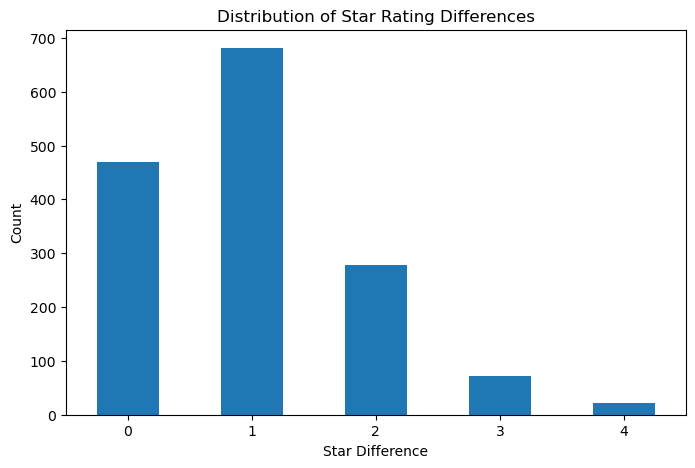

In [222]:
plt.figure(figsize=(8, 5))
tmp['Star_Difference'].value_counts().sort_index().plot(kind='bar')
plt.xlabel('Star Difference')
plt.ylabel('Count')
plt.title('Distribution of Star Rating Differences')
plt.xticks(rotation=0)
plt.show()

In [223]:
counts = tmp['Star_Difference'].value_counts().sort_index()
counts

Star_Difference
0    470
1    681
2    278
3     72
4     22
Name: count, dtype: int64

In [224]:
percentages = (counts / len(tmp) * 100).round(1)
percentages

Star_Difference
0    30.9
1    44.7
2    18.3
3     4.7
4     1.4
Name: count, dtype: float64

Само 31% од податоците "правилно" се категоризираат на овој пристап, 69% имаат грешка од барем 1 ѕвезда, 24% имаат грешка од барем 2 ѕвезди. Сметам дека грешка од 2 ѕвезди е значајна, а како што видовме околу четвртина од податоците би имале ваква грешка. 

Земајќи ги предвид проблемите поврзани со самата target величината и несигурноста околу нејзината точност како мерка, како и фактот што дополнителните информации кои ги носат новите колони (PGDS и Years_Since_Last_Con) не се многу значајни, мислам дека најдобро е да се напушти идеата на користење на ова проширено множество. Дури и да има начин да се извлече информација како комбинација од некои колони, претпоставувам дека далеку повеќе ќе надвладува проблемот на разликата на класи за исти делници од што би придонело таа нова информација во предвидувањето.

---

## Koneчен dataset со кој ќе работиме:

In [229]:
df.columns.tolist()

['Last_Con',
 'Len_Section',
 'Avg_Rain',
 'Max_Snow',
 'Avg_Temp',
 'Max_Temp',
 'Min_Temp',
 'Avg_Altitude',
 'Avg_Speed_Limit',
 'Curve_Char',
 'Avg_Rad',
 'Lat_Force',
 'Avg_Incline',
 'Friction_Coef',
 'Wheel_Ruts',
 'IRI',
 'PCI',
 'Counterslope_Coef',
 'Visibility_H',
 'Visibility_V',
 'Sign_Age',
 'Sign_Renewal',
 'Node_Intersection_Density',
 'Bridge_Param',
 'Target_Wi',
 'Target_Stars',
 'PGDS_Avg']

__Note:__ Годината на последна коловозна конструкција веројатно не би ни значела многу во оваа ситуација, земајќи предвид дека сите редови се однесуваат на 10-годишен период. Во предлог анализата оваа колона не е вклучена во предикторите, но е дадена бидејќи има колони кои зависат од неа.

---

## Истражувачка анализа (EDA)

### _Визуелизации на дистрибуции и outliers:_

Првин да ги видиме дистрибуциите на колоните сами по себе:

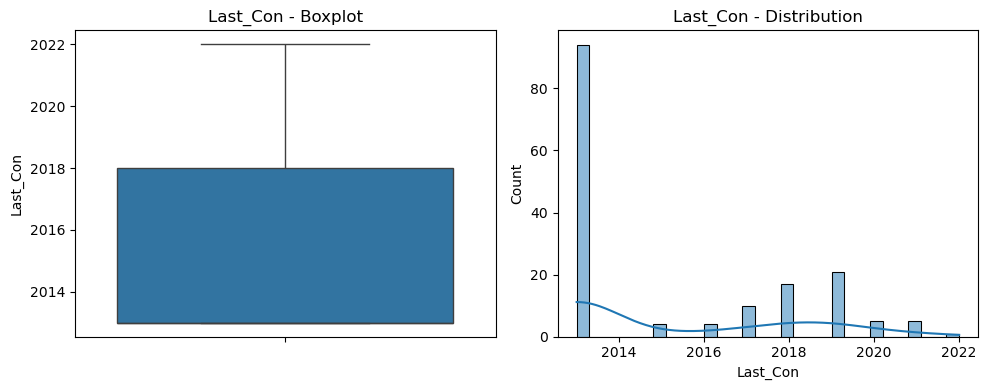

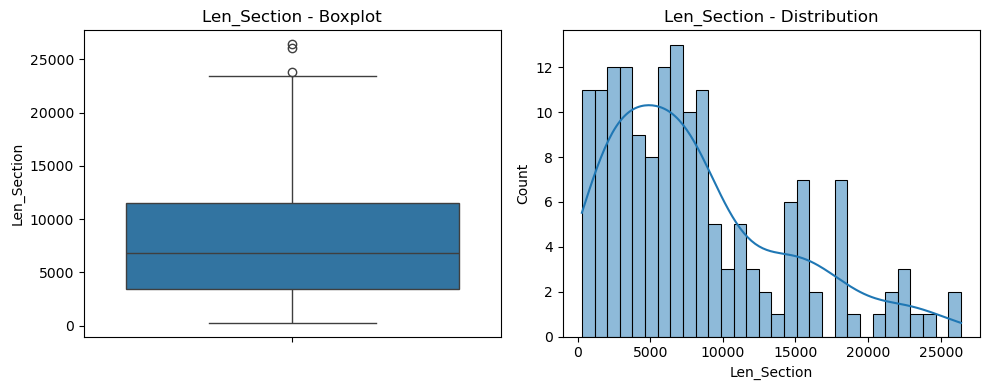

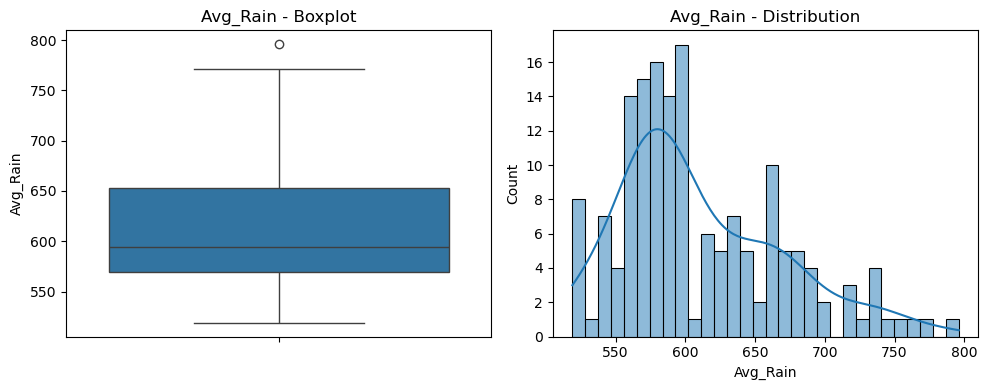

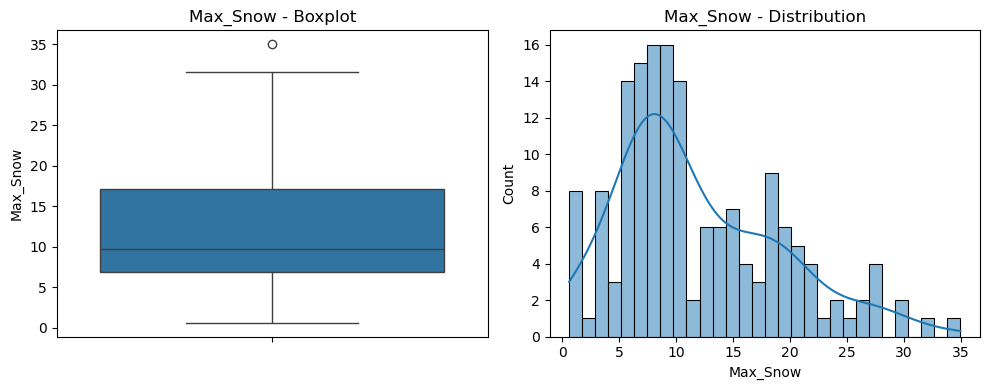

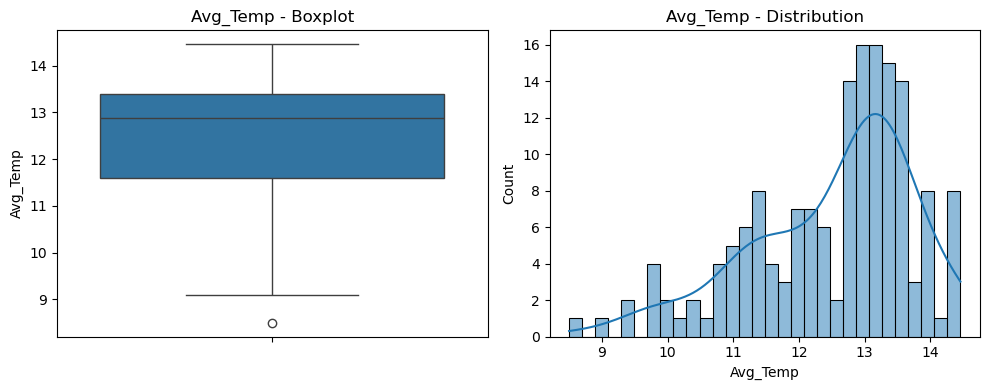

...

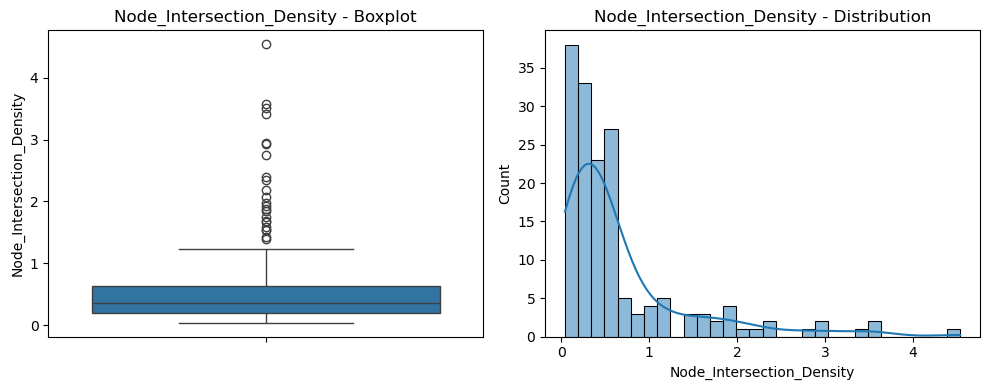

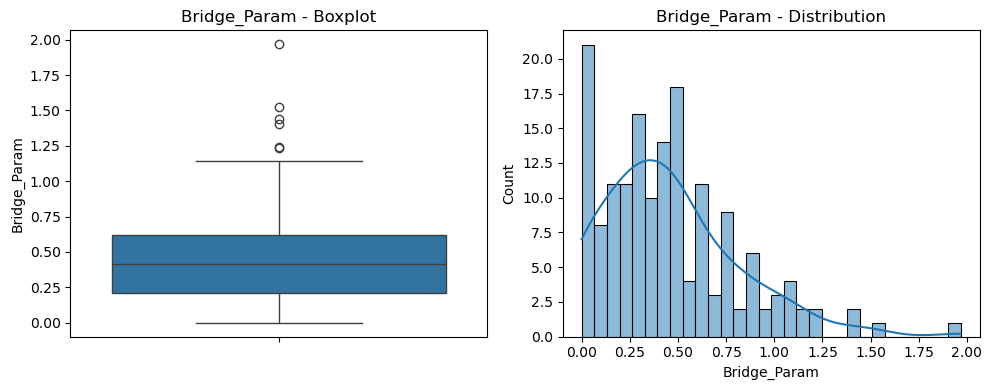

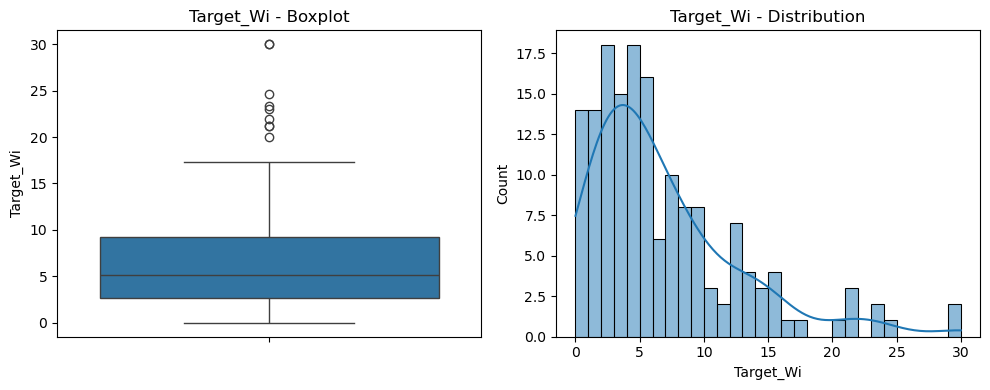

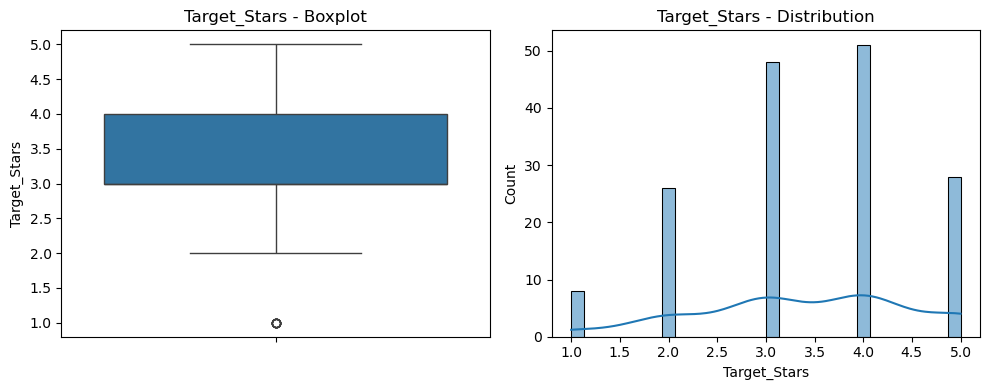

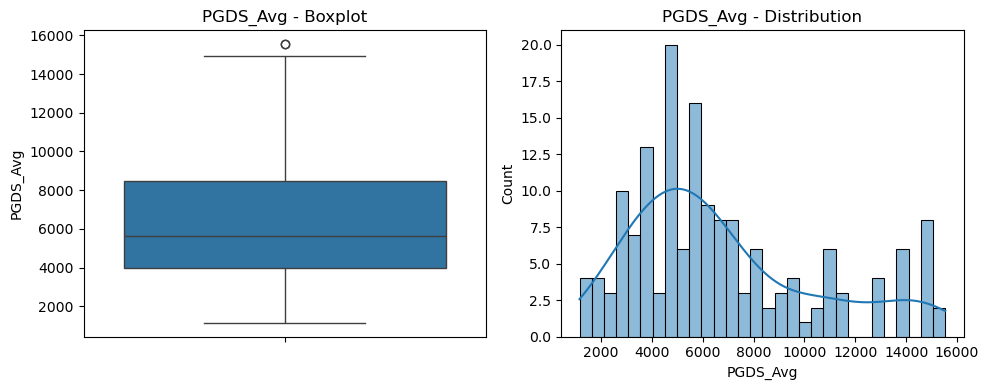

In [235]:
for col in df.columns:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    sns.boxplot(y=df[col], ax=axes[0])
    axes[0].set_title(f'{col} - Boxplot')

    sns.histplot(df[col], bins=30, kde=True, ax=axes[1])
    axes[1].set_title(f'{col} - Distribution')
    
    plt.tight_layout()
    plt.show()

In [236]:
# За outliersot: soijdoidjosijsoijd
# objasni zasho ke gi prifatam kako ekstremni vrednosti koi treba da se sochuvaat 

__Коментар во однос на детектираните outliers на boxplots-от:__ За Avg_Rain, Max_Snow, Avg_Temp, Max_Temp, Min_Temp, Avg_Altitude и PGDS_Avg, од тоа што можам да видам пронајдена е само по една екстремна вредност, и не сметам дека нејзиното отстранување/порамнување би влијаело многу со оглед на тоа што има и други вредности блиску до нив и на хистограите делуваат како природна појава во дистрибуциите. За Curve_Char, Avg_Rad, Lat_Force, Avg_Incline, Counterslope_Coef, Visibility_H, Visibility_V, Node_Intersection_Density и Bridge_Param - сметам дека токму присуство на екстремни вредности во овие категории може да влијае значително на безбедноста на делницата, па за да не се изгуби оваа информација, ќе ги оставам какви што се. Преостанатите неколку колони кои имаат outliers, Friction_Coef, IRI и Wi_Target, секако се во нормалните предвидени граници, па исто така ќе останат непроменети.

А сега да ги споредиме меѓу себе:

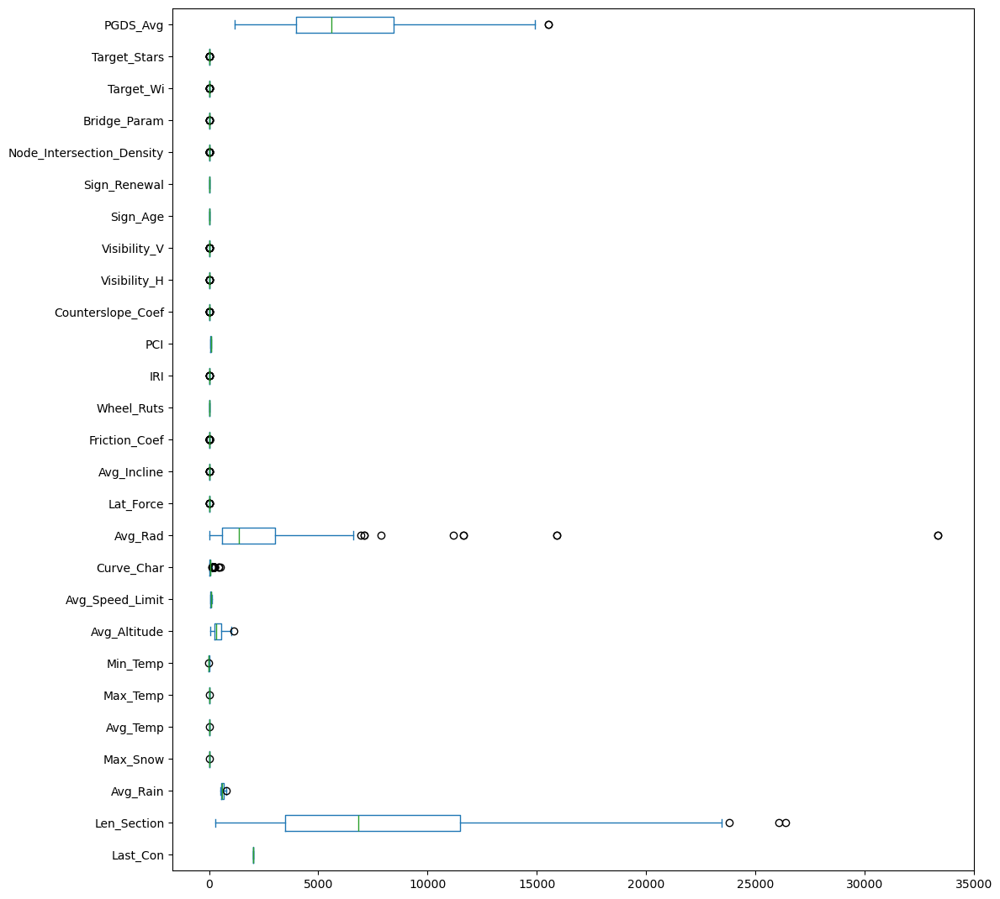

In [239]:
fig, ax = plt.subplots(figsize=(12, len(df.columns) * 0.4))
df.plot.box(ax=ax, vert=False)

plt.tight_layout()
plt.show()

Може да се увиди дека рангот на податоците драстично варира, па би било добро да се скалираат за да не им даваме поголема тежина на оние кои се имаат поголем ранг. За да ги сочуваме екстремите, сметам дека добар начин да го направиме ова е со Min-Max скалирање - за да го сочуваме ефектот на присуството на екстремните вредности кои ги увидовме погоре. Множеството ќе го припремам за работа по останатите визуализации.

### _Pie plots:_

Да се навратиме на дистрибуцијата на една од целните класи (бројот на ѕвезди со која е оценета делницата):

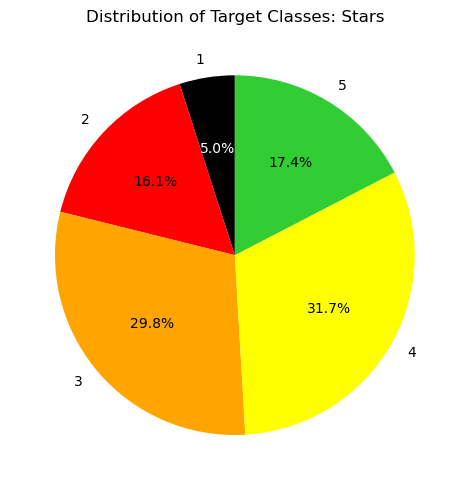

In [243]:
counts_5 = df['Target_Stars'].value_counts().sort_index()

plt.figure(figsize=(5, 5))

wedges, texts, autotexts = plt.pie(
    counts_5.values,
    labels=counts_5.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=['black', 'red', 'orange', 'yellow', 'limegreen']
)

for wedge, autotext in zip(wedges, autotexts):
    if wedge.get_facecolor()[:3] == (0.0, 0.0, 0.0):
        autotext.set_color('white')

plt.title('Distribution of Target Classes: Stars')
plt.ylabel('')
plt.tight_layout()
plt.show()

Видливо е дека имаме нерамномерна дистрибуција на target класата, со кое што ќе се обидам да се справам при тренирање.

### _Scatterplots:_

In [246]:
# remove_cols = ['Last_Con', 'Sign_Renewal', 'Target_Stars', 'Year', 'Unsure_YSLC']
remove_cols = ['Sign_Renewal', 'Target_Stars']

cols_for_scatter = [c for c in df.columns]

for rem in remove_cols:
    cols_for_scatter.remove(rem)

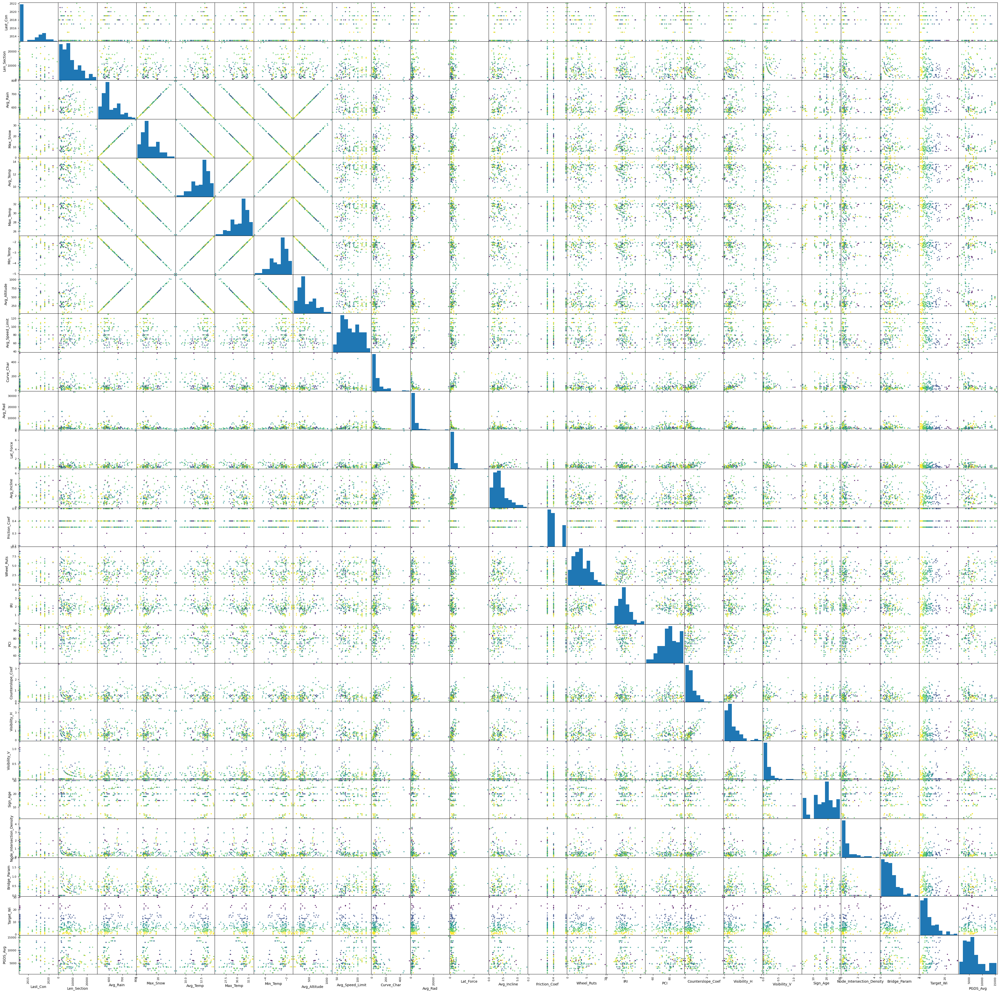

In [247]:
scatter_matrix(df[cols_for_scatter], c=df['Target_Stars'], marker='o', s=10, alpha=.8, figsize  = [50, 50])
plt.show()

Од тоа што можам да видам, освен кај колоните кој означуваат просечни температури, врнежи и снегови - каде што имаме иделана линеарна врска, ретко каде има некаква видлива врска меѓу податоците. Може да се забележи позитивна линеарна врска меѓу Counterslope_Coef и Visibility_H, a исто така позитивна врска меѓу Lat_Force и Avg_Rad но ова се должи на тоа што Lat_Force учествува во формулата за пресметка на Avg_Rad (спомнато во Зависности делот).

### _Корелации / Heatmaps:_

__Пирсонов коефициент на корелација:__

<Axes: >

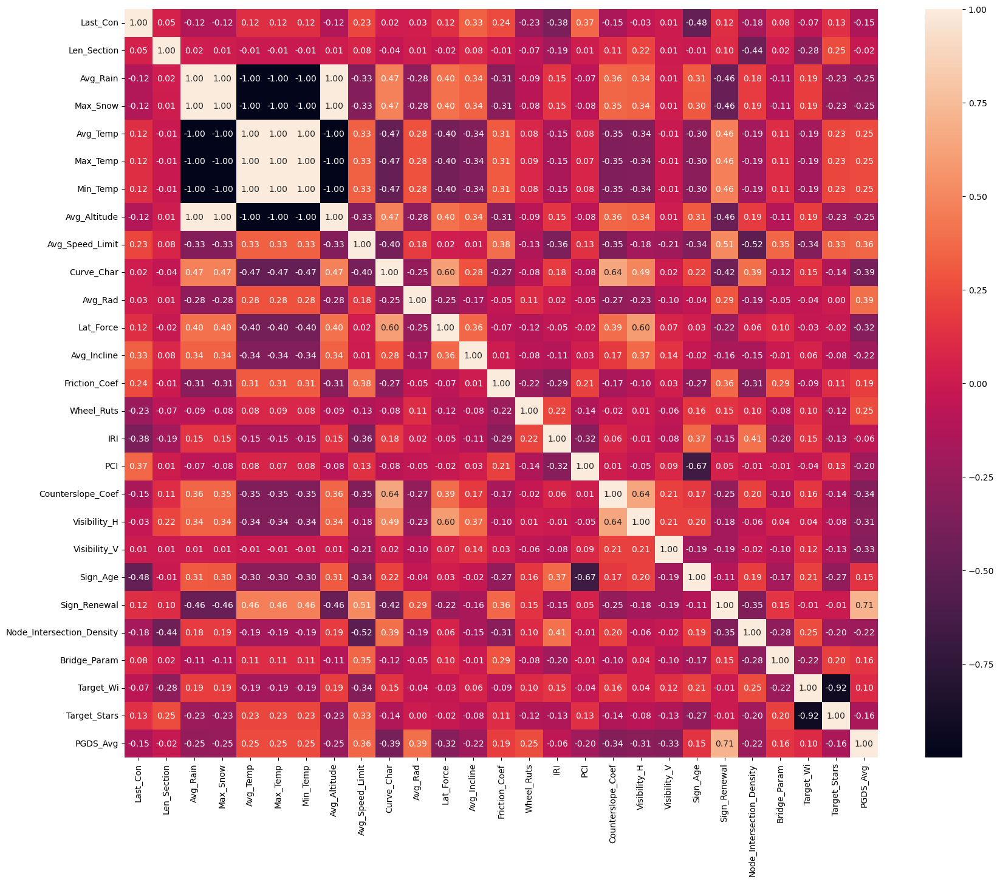

In [251]:
plt.figure(figsize=(20, 16))
sns.heatmap(df.corr(numeric_only=True), annot=True, fmt='.2f')

Пирсоновиот коефициент мери линеарна зависност меѓу променливите. 

Како што можеше да се примети и на scatter plot-от Avg_Rain, Avg_Snow, Avg_Tem, Min_Temp, Max_Temp и Avg_Altitude се сите меѓусебно идеално линеарно корелирани. Ова значи дека податоците на било која една од овие колони може лесно да се одреди преку било која друга, па редундантно е да се сочуваат сите (ја претставуваме истата информација во сите 6 колони, 5 од нив може да се отстранат при тренирањето).

Освен тоа може да видиме висока корелација меѓу target променливите - очекувано бидејќи едната се добива директно од другата, како и делумно силна врска од околу 0.7 меѓу PGDS_Avg и Sign_Renewal, и меѓу Sign_Age и PCI. За последно споменатите корелации може да се увиди на scatterplots-от од претходно дека нема значајна линеарна врска визуелно, сметам дека ова се должи на случајност и начинот кој работи алгоритмот.

Битно е да се напомене дека Пирсоновиот коефициент претпоставува нормална распределба на податоците, која ние реално не ја имаме, па не може сето ова да се земе "здраво за готово".

__Сприманов коефициент на корелација:__

<Axes: >

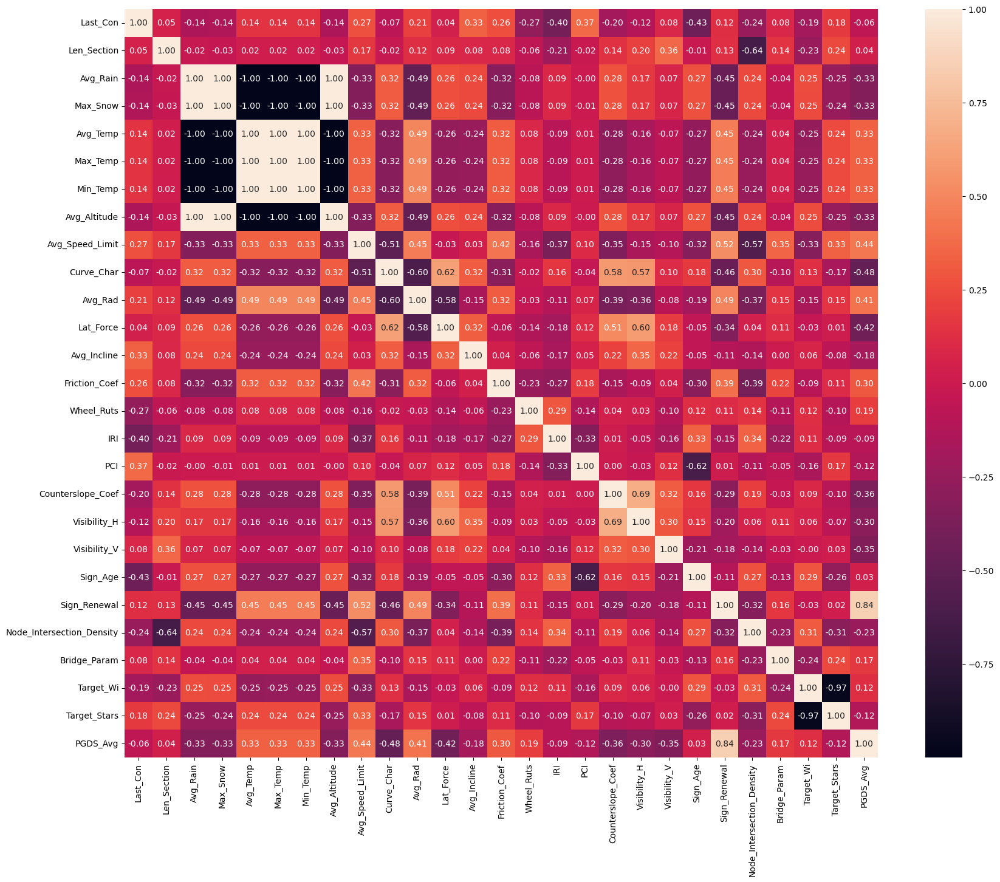

In [257]:
plt.figure(figsize=(20, 16))
cormat = df.corr(method="spearman")
sns.heatmap(cormat, annot=True, fmt='.2f')

Спирмановиот коефициент мери монотона врска меѓу променливите, па како и што би било очекувано резултатите се делумно слични со претходната визуализавија бидејќи овој коефициент исто така ја фаќа и простата линеарна врска како монотона, дополнително пронаоѓа други помалку значајни монотони врски кои пирсоновиот коефициент не може да ги увиди.

__Кендалов коефициент на корелација:__

<Axes: >

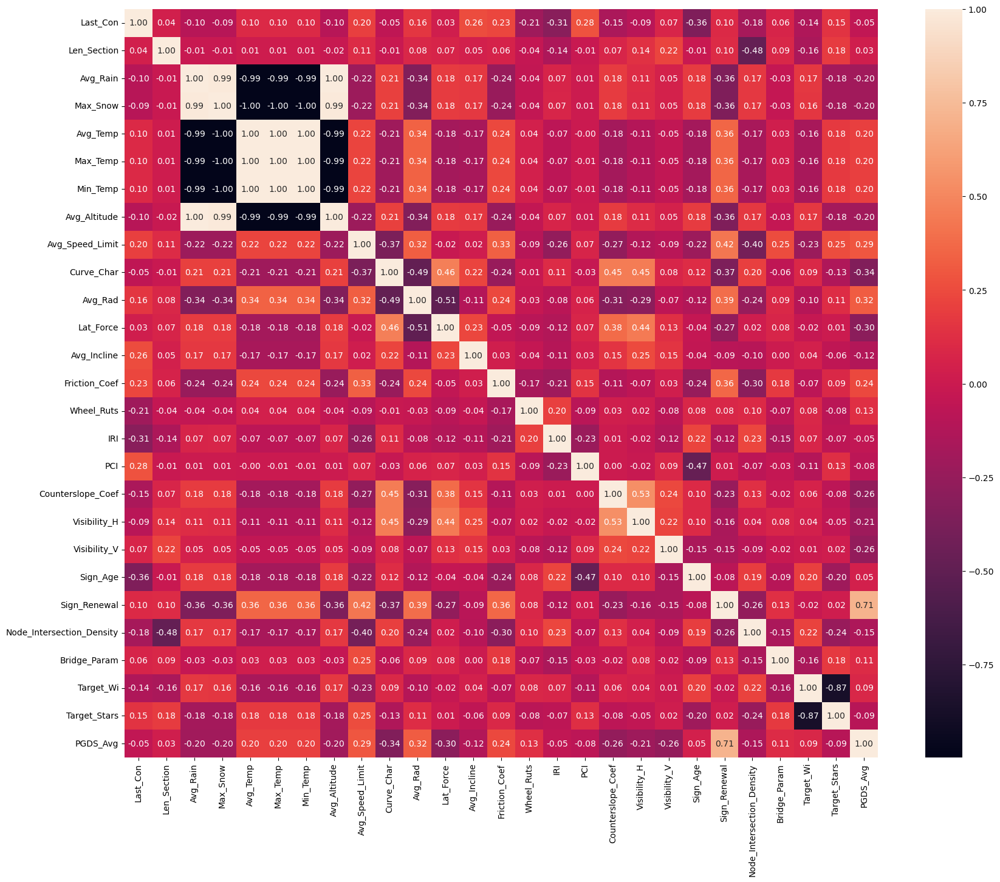

In [260]:
plt.figure(figsize=(20, 16))
cormat = df.corr(method="kendall")
sns.heatmap(cormat, annot=True, fmt='.2f')

Кендаловиот коефициент на коелација повторно мери монотона врска помеѓу атрибутите, но на поинаков начин. Гледа колку парови на координати има кои растат истовремено наспорти колку парови има каде што едната променлива расте, а другата опаѓа - дополнително, не претпоставува нормална распределба на податоците. Овој коефициент генерално подобро се справува со помали податочни множества - како што е нашето и делумно се справува со присуството на екстремни вредности. Покрај сето ова, сепак не гледаме голема разлика меѓу трите визуализации - па заклучоците се исти.

### _Bar plots + Feature importance_

Во оваа секција, ќе го разгледаме MI score-от на нашите променливи во оснос на таргет променливите. 

MI score или Mutual Information score, ни кажува колкава информација ни дава една променлива за друга. Се базира на ентропија, и се гледа колку се намалува несигурноста пред и по присусвото на поможната променлива при одредување на таргетот.

Оваа оцена е поволна бидејѓи може да успее да фати и покомплексни врски од монотони или само линеарни, но од друга страна бара доволно податоци за да може да се постигнат сиггурни заклучоци, а ние располагаме со прилично мал dataset. Сметам дека заклучоците од овие визуализации може да ни служат како водилка, но не мора да се придржуваме ригорозно кон нив.

In [266]:
X = df.drop(columns=['Target_Wi', 'Target_Stars'])

In [267]:
mi_wi = mutual_info_regression(X, df['Target_Wi'], random_state=42)
mi_stars = mutual_info_classif(X, df['Target_Stars'], random_state=42)

In [268]:
mi_df = pd.DataFrame({
    'feature': X.columns,
    'MI_Target_Wi': mi_wi,
    'MI_Target_Stars': mi_stars
})

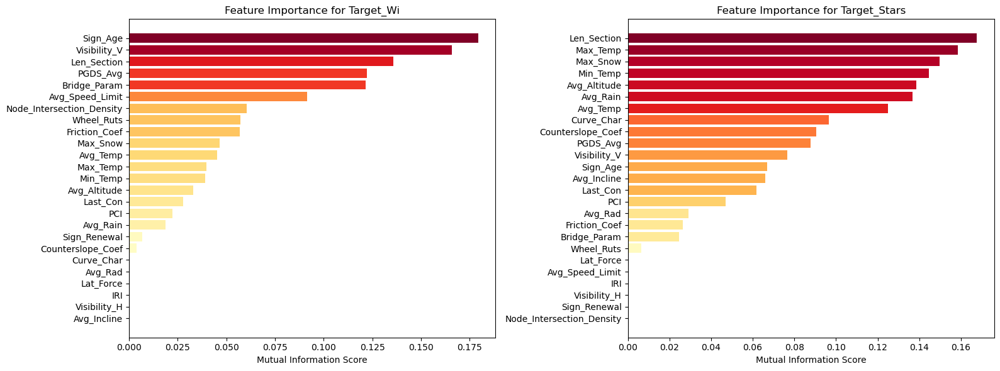

In [269]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

mi_sorted_wi = mi_df.sort_values('MI_Target_Wi', ascending=True)
colors_wi = plt.cm.YlOrRd(mi_sorted_wi['MI_Target_Wi'] / mi_sorted_wi['MI_Target_Wi'].max())
ax1.barh(mi_sorted_wi['feature'], mi_sorted_wi['MI_Target_Wi'], color=colors_wi)
ax1.set_xlabel('Mutual Information Score')
ax1.set_title('Feature Importance for Target_Wi')

mi_sorted_stars = mi_df.sort_values('MI_Target_Stars', ascending=True)
colors_stars = plt.cm.YlOrRd(mi_sorted_stars['MI_Target_Stars'] / mi_sorted_stars['MI_Target_Stars'].max())
ax2.barh(mi_sorted_stars['feature'], mi_sorted_stars['MI_Target_Stars'], color=colors_stars)
ax2.set_xlabel('Mutual Information Score')
ax2.set_title('Feature Importance for Target_Stars')

plt.tight_layout()
plt.show()

Сепак, рангот на MI e (0, +inf), па не е лесно воочливо колку навистина една променлива апсолутно фигурира на targetot, но сепак, од корист е и самата информација на релативните разлики меѓу променливите и нивната подреденост.

Може да видиме дека има доста разлики во MI оцените за двата параметри, но Lat_Force, Visibility_H и IRI во двата случаеви имаат MI score од 0 - што значи дека нема разлика во одредувањето на сигурнота на targetot при познати и непознати вредности на овие променливи. Не мора да значи дека овие променливи немаат никакво влијание при одредување на безбедноста, има комплексни врски кои MI може да ги промаши, особено при помал dataset, но и можно е овие променливи да даваат значајна информација во комбинација со некоја друга постоечка променлива.

Од корист би било да се проба и варијанта на тренирање со испуштање на овие параметри, па да се направи споредба на финалните резултати.

---

# Скалирање и подготовка на податоците за модели

In [276]:
# gi iskluchuvame poradi visoka linearna korelacija (ne se odnesuva na target promenlivite):
remove_from_X = ["Target_Wi", "Target_Stars", "Avg_Rain", "Avg_Temp", "Max_Temp", "Min_Temp", "Avg_Altitude"]

# mozhe da se proba da se iskluchat podocna:
keep_for_now = ["Lat_Force", "Visibility_H", "IRI"]

In [277]:
cols_X = df.columns.tolist()
cols_X = [x for x in cols_X if x not in remove_from_X]
# cols_X

In [278]:
cols_y = ["Target_Wi", "Target_Stars"]

In [279]:
X = df[cols_X].copy()
y = df[cols_y].copy()

In [280]:
min_max_scaler_X = MinMaxScaler()
min_max_scaler_y = MinMaxScaler()

In [281]:
scaled_X = X.copy()
scaled_y = y.copy()

scaled_X[cols_X] = min_max_scaler_X.fit_transform(X[cols_X])
scaled_y[cols_y] = min_max_scaler_y.fit_transform(y[cols_y])

---

# Обид за давање оценка на постоечката поделба по категории преку ненадгледувано учење:

Идеата ми е следна, земајќи ги предвид колоните со кои се предложени како input на моделот, да истренирам неколку модели за кластерирање со кои ќе видиме дали навитина се совпаѓа предложената поделба на категории според inputot. 

Доколку навистина увидиме фомација на 5 кластери, кои идеално би имале мала стандардна девијација и значајна разлика во нивните просечни вредности, може да се предложи алтернативна поделба на границата на категории според овие сознанја. 

Да видиме како изгледа множеството после применување на PCA.

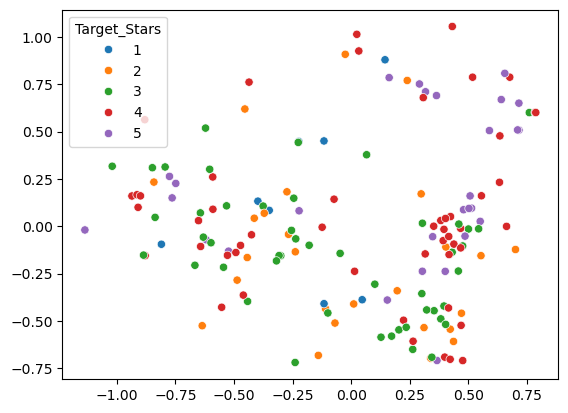

In [287]:
pca = PCA(n_components=2)
data_pca = pca.fit(scaled_X).transform(scaled_X)
sns.scatterplot(x=data_pca[:,0], y=data_pca[:,1], hue=y.iloc[:, 1], palette="tab10")
plt.show()

In [288]:
pca = PCA(n_components=3)
X_pca = pca.fit_transform(scaled_X)

fig = px.scatter_3d(x=X_pca[:, 0], y=X_pca[:, 1], z=X_pca[:, 2], 
                    color=y.iloc[:, 1].astype(str))
fig.update_traces(marker=dict(size=5))
fig.update_layout(width=1000, height=1000)
fig.show()

Во две, па и во три димензии не можеме увидиме присуство на кластери, па сите анализи понатаму ќе бидат правени врз високодимензионален простор, бидејќи при намалувањето веројатно губиме доста информации.

Следен чекор би било да продолжиме на неколку алгоритми за кластерирање:

## K-Means:

In [292]:
k_means = KMeans(n_clusters=5, random_state=42, n_init=500)

In [293]:
df['K_Means'] = k_means.fit_predict(scaled_X)

In [294]:
def visualise_cluster_dist(df, ref_col):
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    
    star_colors = {1: 'black', 2: 'red', 3: 'orange', 4: 'yellow', 5: 'limegreen'}
    
    for cluster in range(5):
        cluster_data = df[df[ref_col] == cluster]['Target_Stars'].value_counts().sort_index()
        colors = [star_colors[star] for star in cluster_data.index]
        
        wedges, texts, autotexts = axes[cluster].pie(
            cluster_data.values, 
            labels=cluster_data.index, 
            autopct='%1.1f%%',
            startangle=90,
            colors=colors
        )
        
        for wedge, autotext in zip(wedges, autotexts):
            if wedge.get_facecolor()[:3] == (0.0, 0.0, 0.0):
                autotext.set_color('white')
        
        axes[cluster].set_title(f'Cluster {cluster}\n(n={len(df[df[ref_col]==cluster])})')
    
    plt.suptitle(f'Distribution of Star Ratings per Cluster ({ref_col})', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

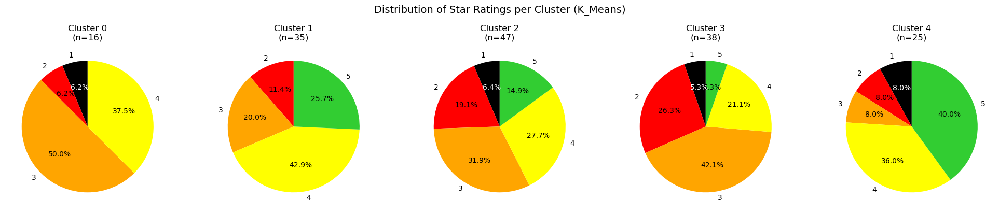

In [295]:
visualise_cluster_dist(df, 'K_Means')

K-Means не се снаоѓа добро во високодимензионален простор, па и делумно очекувано е да не добиеме значајни резултати тука, може едино да пробаме да ги отстраниме колоните за кои дискутиравме претходно да видиме дали би помогнало тоа:

In [297]:
k_means = KMeans(n_clusters=5, random_state=42, n_init=500)

In [298]:
reduced_cols = [x for x in scaled_X.columns if x not in keep_for_now]

In [299]:
df['K_Means_Reduced'] = k_means.fit_predict(scaled_X[reduced_cols])

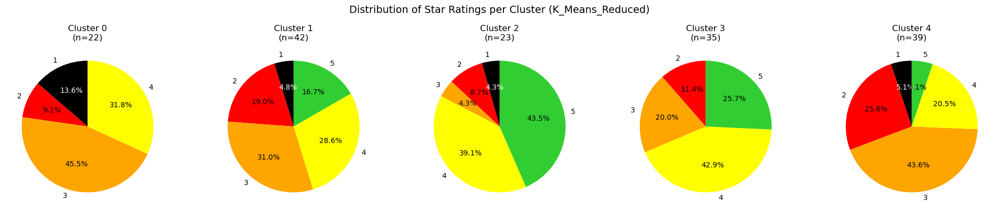

In [300]:
visualise_cluster_dist(df, 'K_Means_Reduced')

И ова не помогна многу, што доколку го редуцираме уште повеќе бројот на предиктори со помош на PCA првин?

Ќе одлучиме на колку димензии да намалиме преку кумулативна сума на варијансите од променливите кои располагаме, при секоја можна вредност на број на променливи. Ќе пробаме да ја задржиме 90% од кумулативната варијанса при нашиот избор.

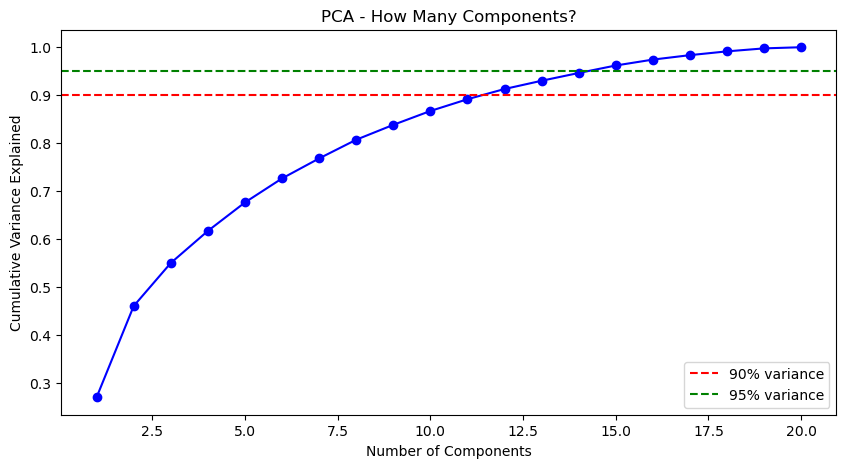

Components needed for 90% variance: 12


In [302]:
pca_full = PCA()
pca_full.fit(scaled_X)

cumvar = pca_full.explained_variance_ratio_.cumsum()
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(cumvar) + 1), cumvar, 'bo-')
plt.axhline(y=0.90, color='r', linestyle='--', label='90% variance')
plt.axhline(y=0.95, color='g', linestyle='--', label='95% variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('PCA - How Many Components?')
plt.legend()
plt.show()

n_components_90 = (cumvar >= 0.90).argmax() + 1
print(f"Components needed for 90% variance: {n_components_90}")

Гледаме дека бројот на димензии на кои треба да намалиме е 12.

In [304]:
pca = PCA(n_components=n_components_90)
X_reduced_PCA = pca.fit_transform(scaled_X)

In [305]:
k_means = KMeans(n_clusters=5, random_state=42, n_init=500)

In [306]:
df['K_Means_PCA'] = k_means.fit_predict(X_reduced_PCA)

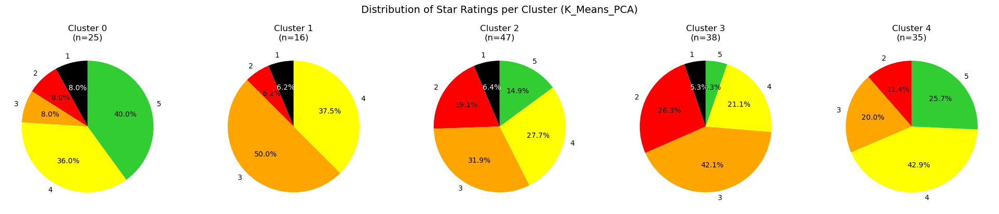

In [307]:
visualise_cluster_dist(df, 'K_Means_PCA')

Дури со PCA, не добиваме значајни кластери.

## Agglomerative Clustering:

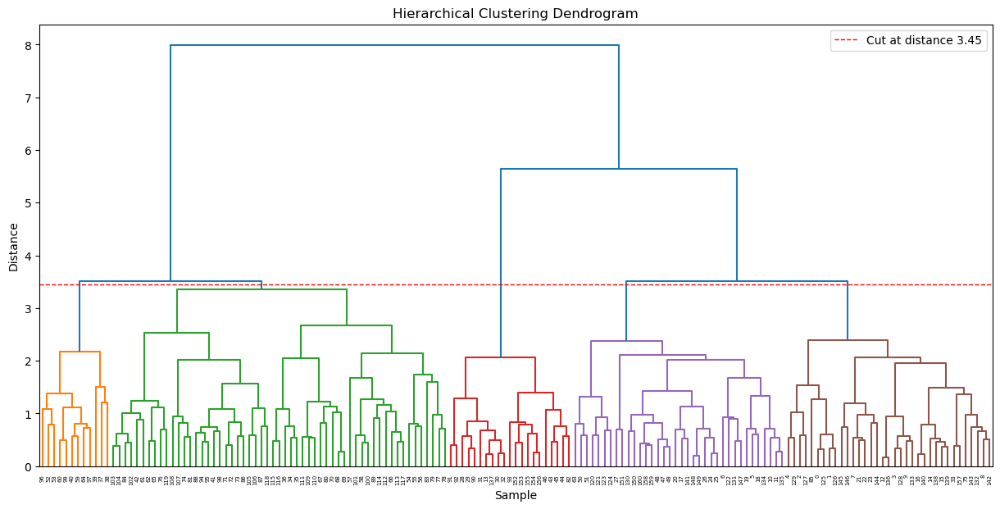

In [333]:
plt.figure(figsize=(15, 7))
linkage_matrix = linkage(scaled_X, method='ward')
dendrogram(linkage_matrix, color_threshold=3.45)
plt.axhline(y=3.45, color='r', linestyle='--', linewidth=1, label='Cut at distance 3.45')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample')
plt.ylabel('Distance')
plt.legend()
plt.show()

Може да видиме дека доколку ја пресечеме y-оската на 3.45, добиваме формација на 5 кластери.

In [340]:
agg = AgglomerativeClustering(n_clusters=5)
df['Agg'] = agg.fit_predict(scaled_X)

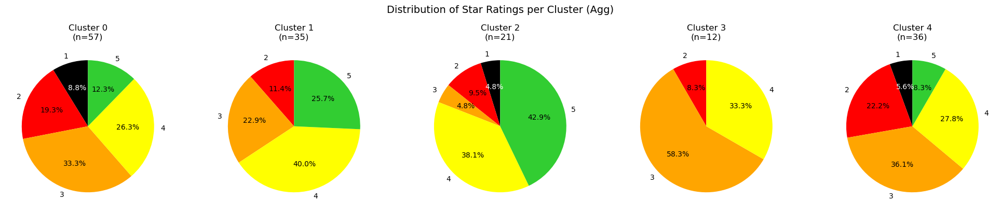

In [342]:
visualise_cluster_dist(df, 'Agg')

Како и K-Means, агломеративното кластериранје исто потешко се снаоѓа во високодимензионален простор, па ќе пробаме повторно со PCA да го намалиме:

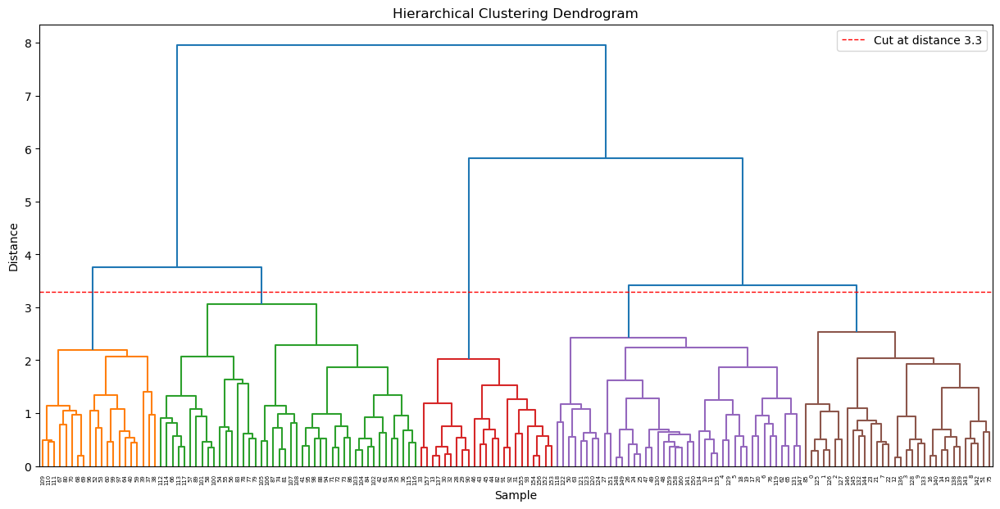

In [353]:
plt.figure(figsize=(15, 7))
linkage_matrix = linkage(X_reduced_PCA, method='ward')
dendrogram(linkage_matrix, color_threshold=3.3)
plt.axhline(y=3.3, color='r', linestyle='--', linewidth=1, label='Cut at distance 3.3')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample')
plt.ylabel('Distance')
plt.legend()
plt.show()

In [355]:
agg = AgglomerativeClustering(n_clusters=5)
df['Agg_PCA'] = agg.fit_predict(X_reduced_PCA)

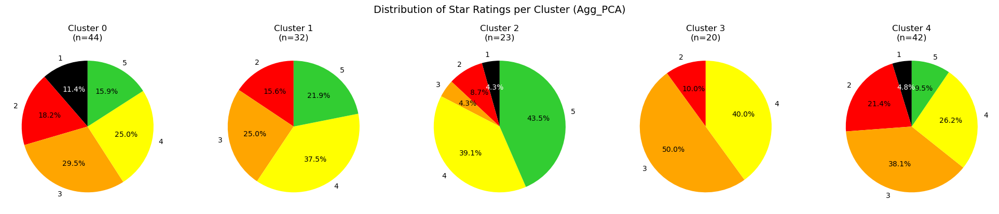

In [357]:
visualise_cluster_dist(df, 'Agg_PCA')

За жал, повторно ништо...

## Gaussian Mixture Model

In [371]:
gmm = GaussianMixture(n_components=5, random_state=42)

In [373]:
df['GMM'] = gmm.fit_predict(scaled_X) 

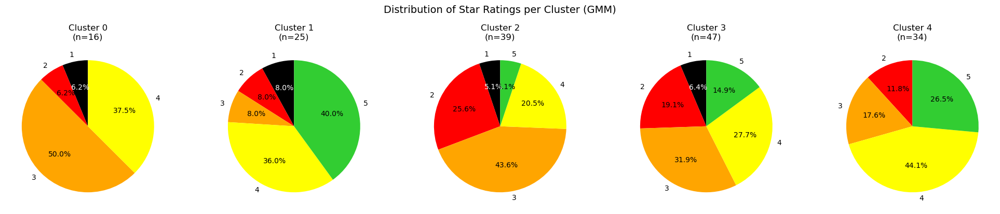

In [375]:
visualise_cluster_dist(df, 'GMM')

In [ ]:
gmm = GaussianMixture(n_components=5, random_state=42)

In [377]:
df['GMM_PCA'] = gmm.fit_predict(X_reduced_PCA) 

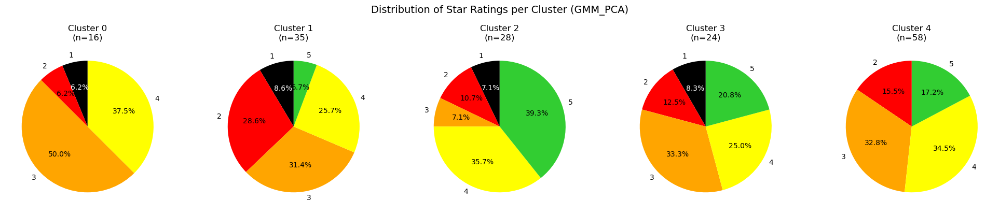

In [379]:
visualise_cluster_dist(df, 'GMM_PCA')

Повторно, безнадежно.

## Spectral Clustering

In [382]:
spectral = SpectralClustering(n_clusters=5, affinity='nearest_neighbors', random_state=42)

In [384]:
df['Spectral'] = spectral.fit_predict(scaled_X)

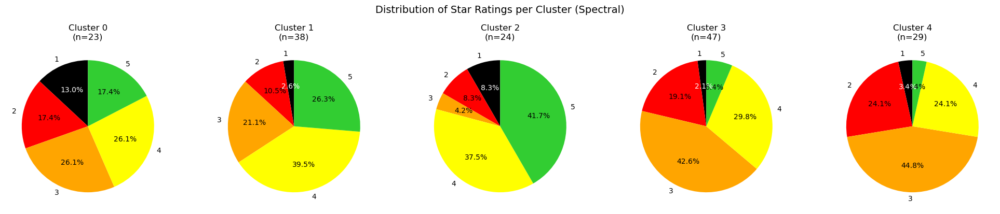

In [386]:
visualise_cluster_dist(df, 'Spectral')

In [390]:
spectral = SpectralClustering(n_clusters=5, affinity='nearest_neighbors', random_state=42)

In [392]:
df['Spectral_PCA'] = spectral.fit_predict(X_reduced_PCA)

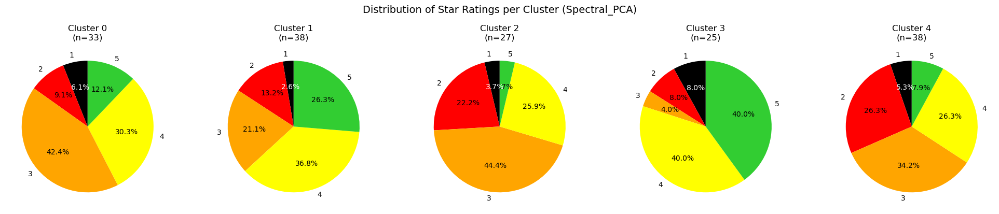

In [396]:
visualise_cluster_dist(df, 'Spectral_PCA')

Исто и со последните обиди.

Очигледно, ненадгледуваното учење не може да ни помогне за редефинирање на праговите на нашите класи, што ни кажува дека предикторите не се многу слични меѓусебно во групите кои се наоѓаат, или евентуално групите се покомплексни од она што можат испробаните модели да фатат. 

Сметам дека следен добар чекор би било да се проба тренирање на некои модели кои добро се справуваат со големиот број на предиктори, (како регресиони модели или дрва на одлука) во комбинација со некоја техника на cross-валидација, за да се справиме подобро со големината на множеството, притоа може и да се примени неслучаен избор при одредување на групите за тренирање и тестирање, за да се справиме со проблемот на нееднакви удели на класите во множеството.

---

# Обид за тренирање на регресиони алгоритми

In [8]:
# to be continued...